In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import warnings
import pickle
import myUtils
import os
from myUtils import *
from models.utils import *
from AOPC import *
from score import ScoreUtils
from models.dataset_loader import *
import sys
sys.path.append('models')

warnings.simplefilter("ignore")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch._C._jit_set_texpr_fuser_enabled(False)
model_name = 'huawei-noah/TinyBERT_General_4L_312D'

In [2]:
sorting = "confidence"
delta = 0.1
tokenizer = AutoTokenizer.from_pretrained(model_name, use_fast = False)
myUtils.tokenizer = tokenizer

params: modefied = True, num_removes = 30

In [3]:
def prepare(ds_name, model_type, folder_name):
    anchor_examples = pickle.load(open(f"{folder_name}/anchor_examples.pickle", "rb" ))
    labels = pickle.load(open(f"{folder_name}/labels.pickle", "rb" ))
    model = load_model(f'models/{model_type}/{ds_name}/model').to(device).eval()
    myUtils.model = model
    title = f"{model_type} {ds_name}"
    return anchor_examples, labels, model, title

# TinyBert

## Corona

In [4]:
ds_name = 'corona'
model_type = 'tinybert'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

In [ ]:
exps_dict = dict()
exps_dict['0.1'] = pickle.load(open(f"{folder_name}/exps_list.pickle", "rb" ))
exps_dict['desired'] = pickle.load(open(f"{folder_name}/../desired/exps_list.pickle", "rb" ))
AOPC.time_aopc_monitor(title, model, model_type, ds_name, exps_dict, tokenizer, anchor_examples, labels, top=30, alpha = 0.95)

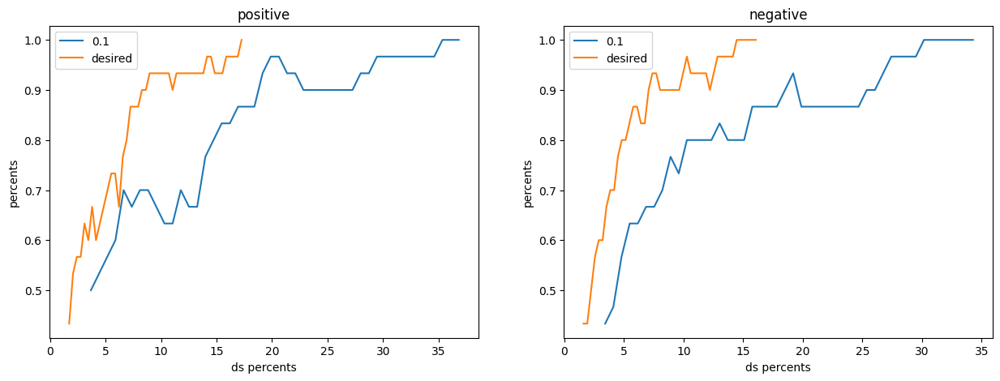

In [11]:
exps_dict = dict()
exps_dict['0.1'] = pickle.load(open(f"{folder_name}/exps_list.pickle", "rb" ))
exps_dict['desired'] = pickle.load(open(f"{folder_name}/../desired/exps_list.pickle", "rb" ))
AOPC.time_monitor(model_type, ds_name, exps_dict, tokenizer, anchor_examples, labels, top=30, alpha = 0.95)

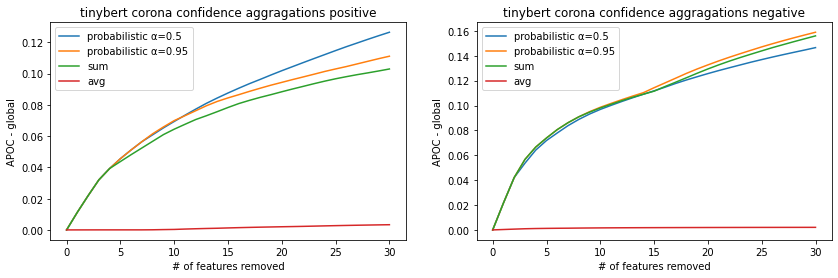

In [10]:
cur_delta = 0.5
aggragations = ['', '', 'sum_', 'avg_']
alphas = [0.5, 0.95, None, None]
legends = ['probabilistic α=0.5', 'probabilistic α=0.95', 'sum', 'avg']
get_scores_fn = lambda x: ScoreUtils.get_scores_dict(folder_name, folder_name, trail_path = f"../{cur_delta = 0.5}/{x[0]}scores.xlsx", alpha = x[1])
AOPC.compare_aopcs(model, tokenizer, zip(aggragations, alphas), get_scores_fn, anchor_examples, labels, legends, f'{title} aggragations', num_removes=30, modified=True)

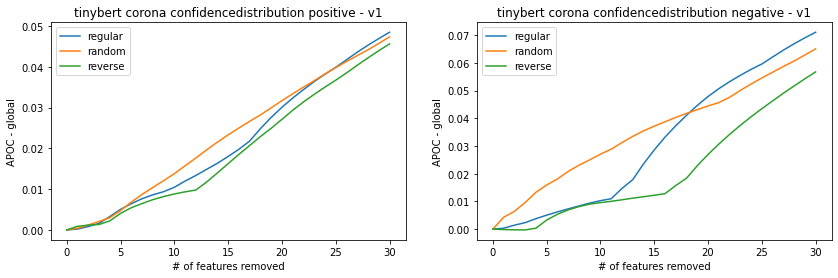

In [51]:
p, n = AOPC.words_distributions(anchor_examples, labels, tokenizer)
distriution_aopc = AOPC(model, tokenizer, anchor_examples, labels, p, n, title + 'distribution', modified = True, num_removes = 30)
distriution_aopc.aopc_global('remove')

### Apoc

In [7]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

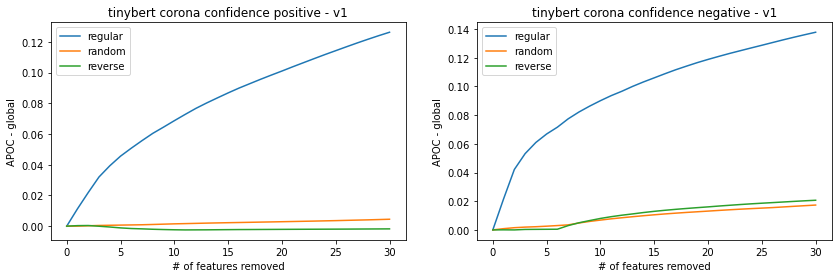

In [22]:
aopc.aopc_global('remove')

### Compare

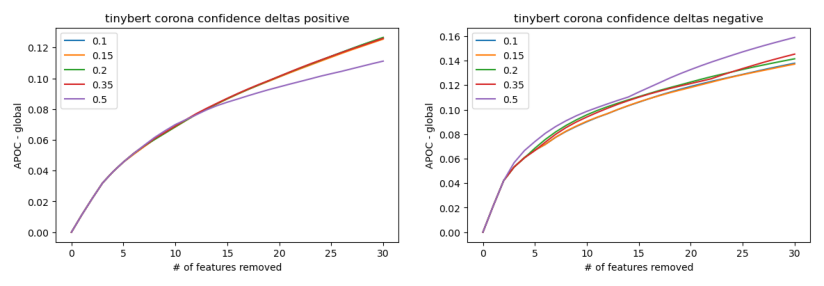

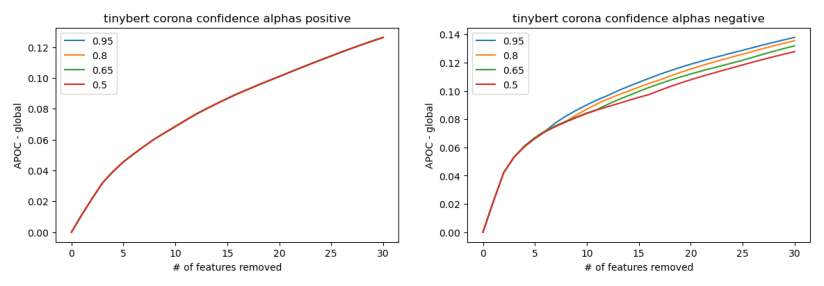

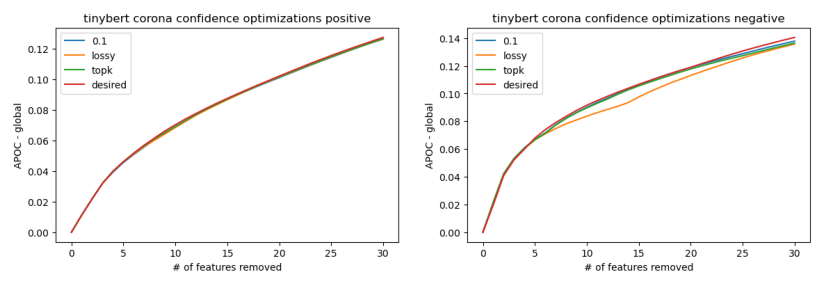

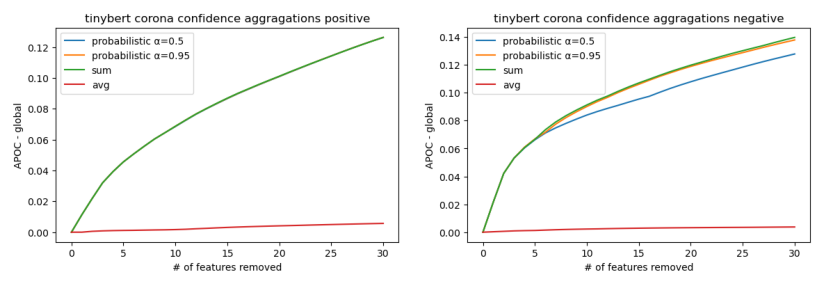

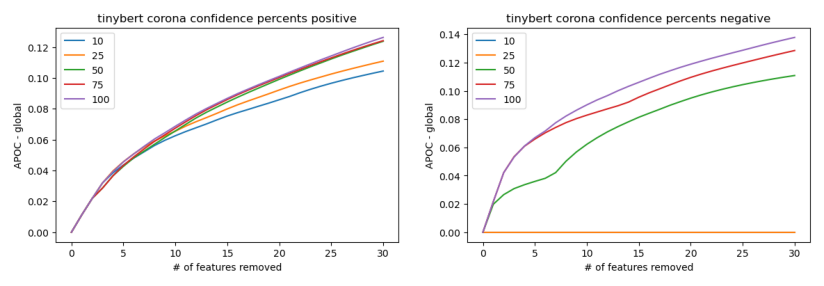

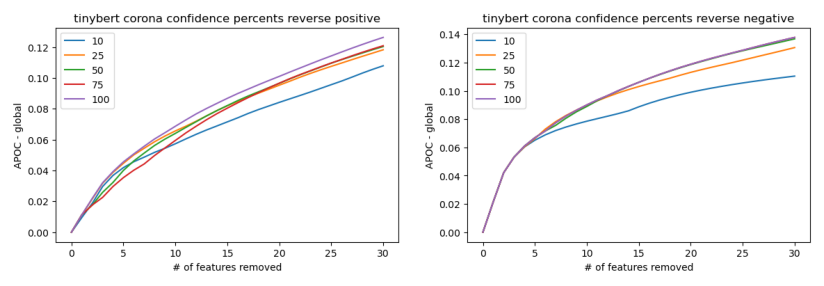

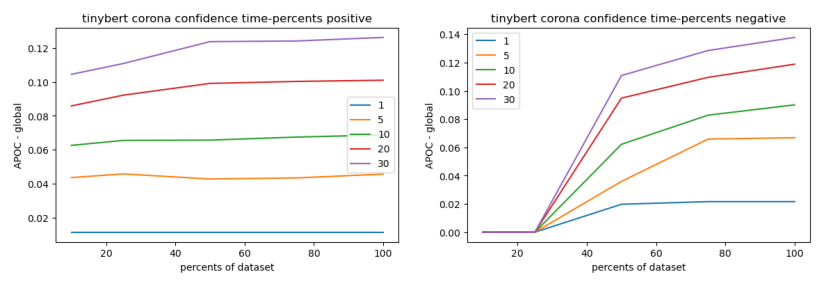

In [10]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

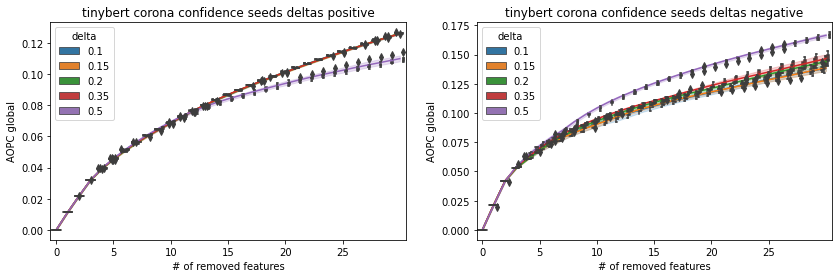

In [5]:
deltas = [0.1, 0.15, 0.2, 0.35, 0.5]
seeds = [42, 84, 126, 168, 210]
AOPC.compare_random_aopcs(folder_name, model, tokenizer, seeds, deltas, anchor_examples, labels, deltas, f'{title} seeds deltas', modified = True, num_removes = 30)

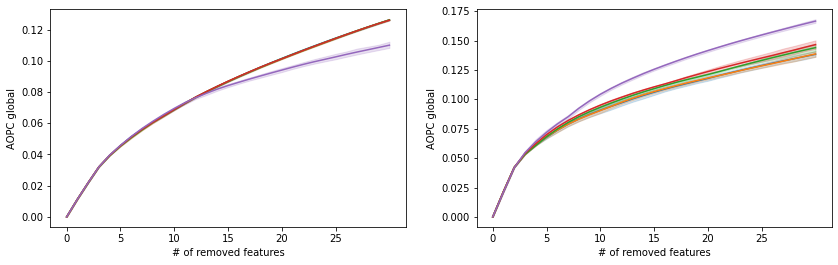

In [4]:
deltas = [0.1, 0.15, 0.2, 0.35, 0.5]
seeds = [42, 84, 126, 168, 210]
AOPC.compare_random_aopcs(folder_name, model, tokenizer, seeds, deltas, anchor_examples, labels, deltas, f'{title} seeds deltas', modified = True, num_removes = 30)

### masking

In [ ]:
# # when masking changing probability to 0.3
# folder_name = f'results/masking/{model_type}/{ds_name}/{sorting}/{delta}'
# pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
# pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
# aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)
# aopc.aopc_global('remove')

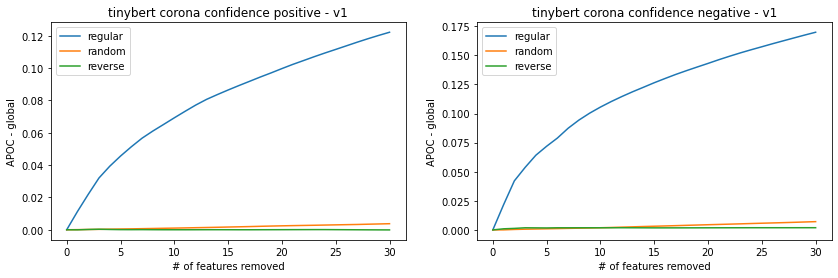

In [17]:
# when changing masking options to 50 instead of 500
masking_folder = f'results/masking_50/{model_type}/{ds_name}/{sorting}/{delta}'
pos_scores, neg_scores = ScoreUtils.get_scores_dict(masking_folder, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)
aopc.aopc_global('remove')

## Corona-lossy

In [ ]:
ds_name = 'corona'
model_type = 'tinybert'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/lossy-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [4]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

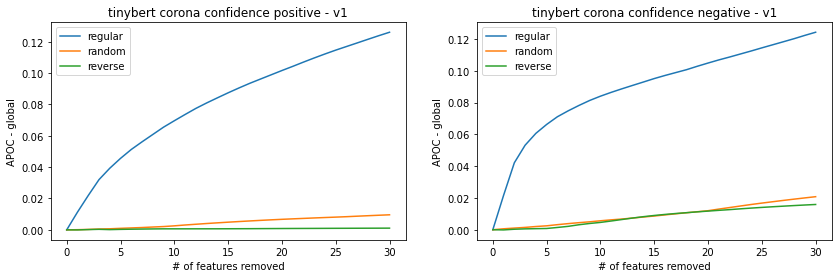

In [5]:
aopc.aopc_global('remove')

### Compare

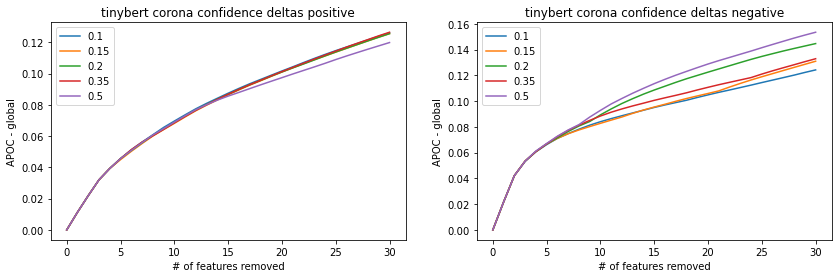

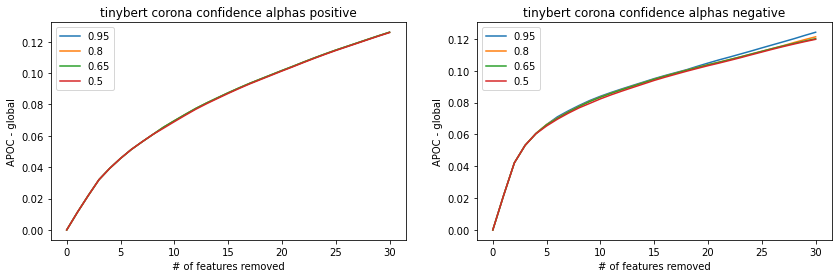

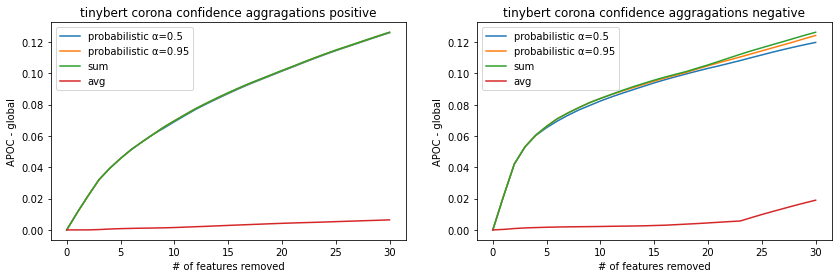

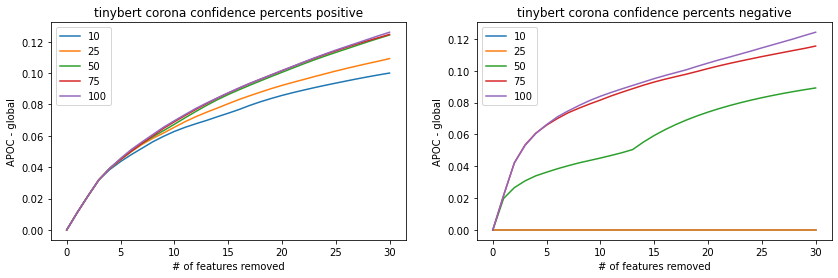

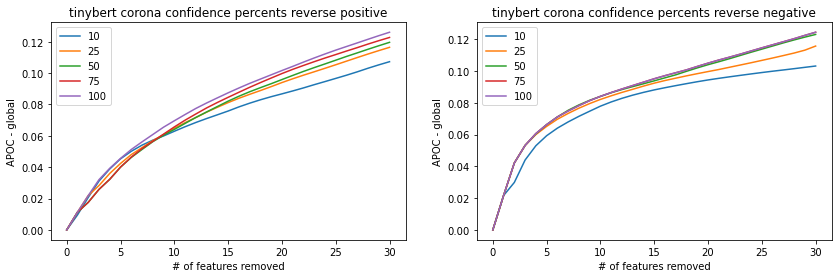

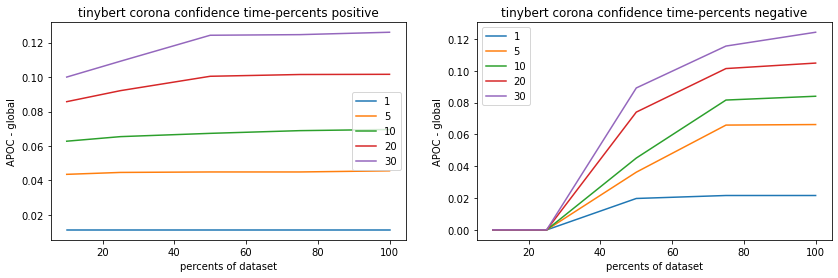

In [7]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

## Corona-lossy-topk

In [3]:
ds_name = 'corona'
model_type = 'tinybert'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/lossy-topk-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [4]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

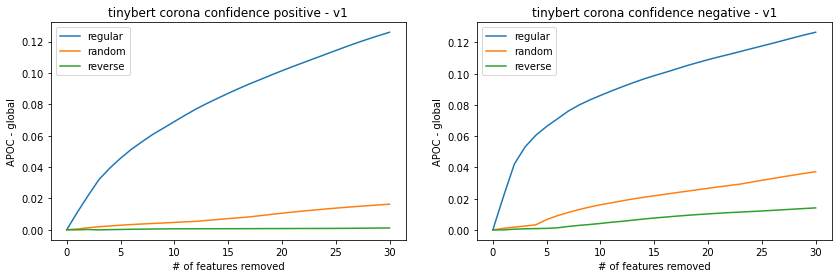

In [5]:
aopc.aopc_global('remove')

### Compare

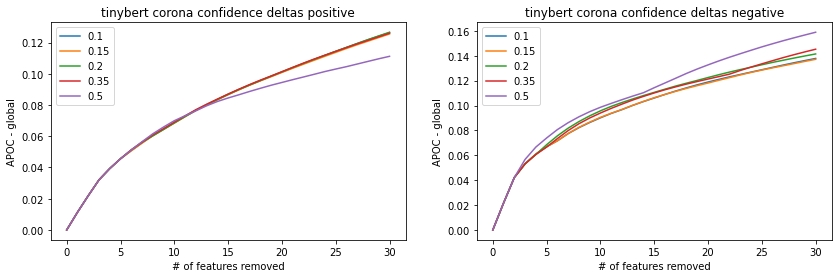

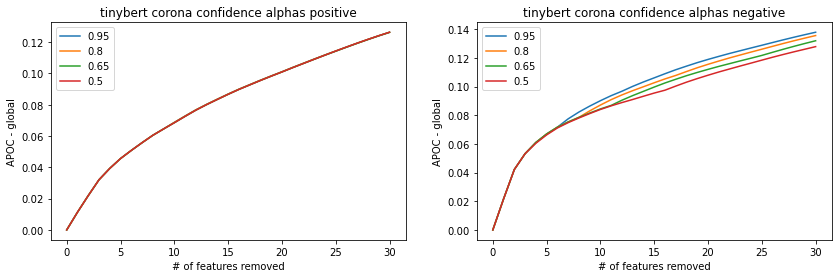

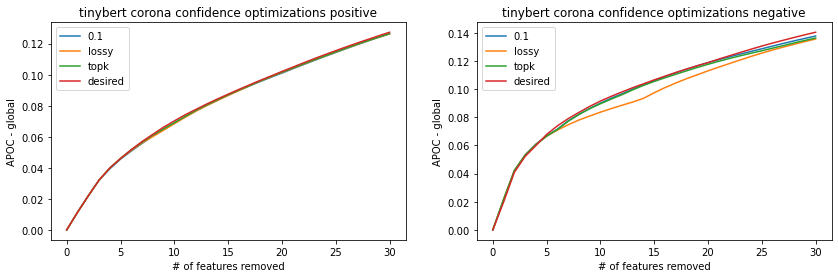

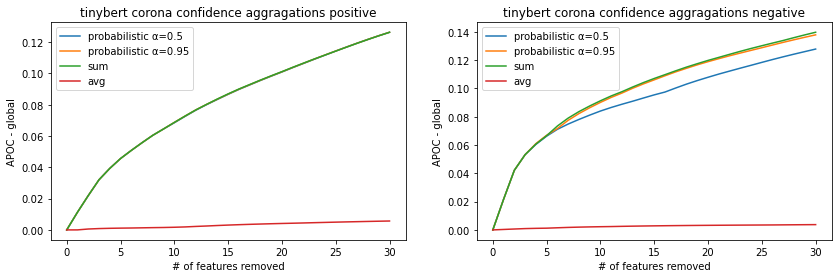

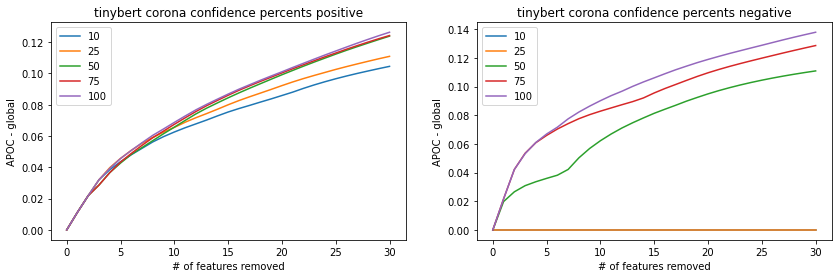

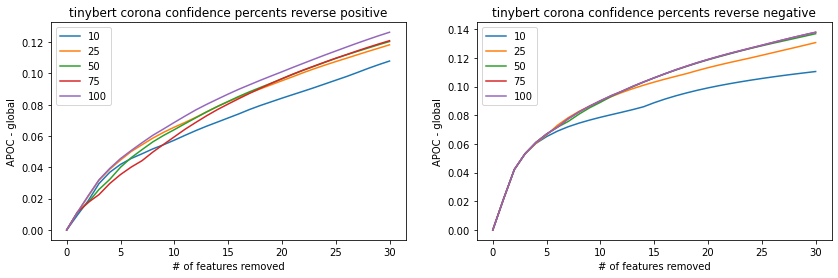

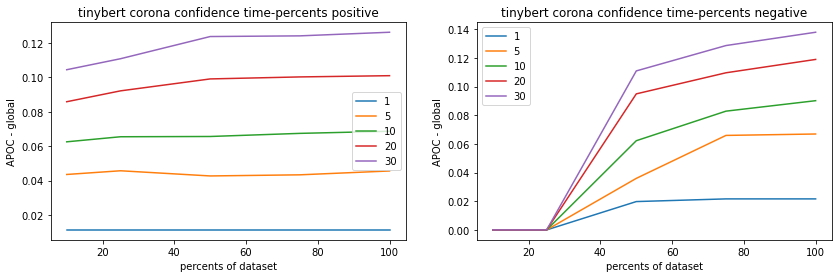

In [6]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

## Sentiment

In [11]:
ds_name = 'sentiment'
model_type = 'tinybert'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

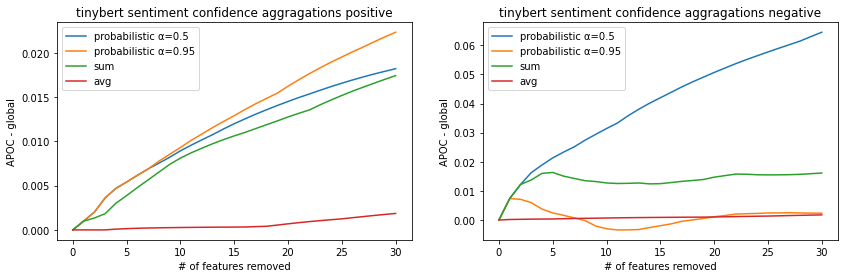

In [13]:
cur_delta = 0.5
aggragations = ['', '', 'sum_', 'avg_']
alphas = [0.5, 0.95, None, None]
legends = ['probabilistic α=0.5', 'probabilistic α=0.95', 'sum', 'avg']
get_scores_fn = lambda x: ScoreUtils.get_scores_dict(folder_name, folder_name, trail_path = f"../{cur_delta}/{x[0]}scores.xlsx", alpha = x[1])
AOPC.compare_aopcs(model, tokenizer, zip(aggragations, alphas), get_scores_fn, anchor_examples, labels, legends, f'{title} aggragations', num_removes=30, modified=True)

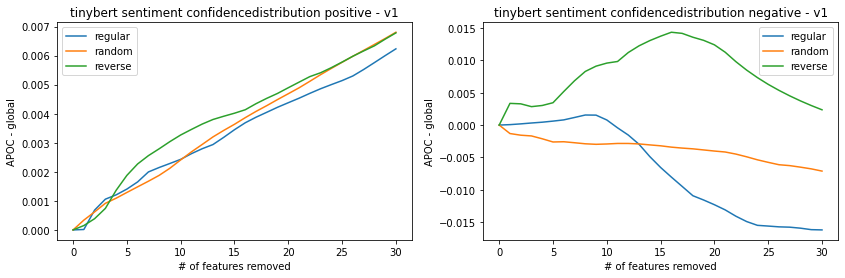

In [53]:
p, n = AOPC.words_distributions(anchor_examples, labels, tokenizer)
distriution_aopc = AOPC(model, tokenizer, anchor_examples, labels, p, n, title + 'distribution', modified = True, num_removes = 30)
distriution_aopc.aopc_global('remove')

### Apoc

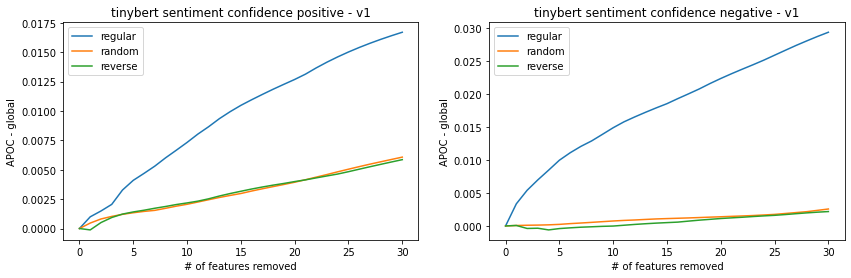

In [20]:
""" lossy aopc """
lossy_folder = f'results/{model_type}/{ds_name}/{sorting}/lossy'
pos_scores, neg_scores = ScoreUtils.get_scores_dict(lossy_folder, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)
aopc.aopc_global('remove')

In [27]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

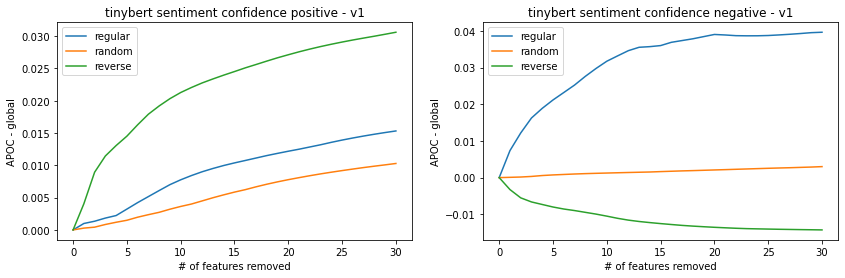

In [28]:
aopc.aopc_global('remove')

### Compare

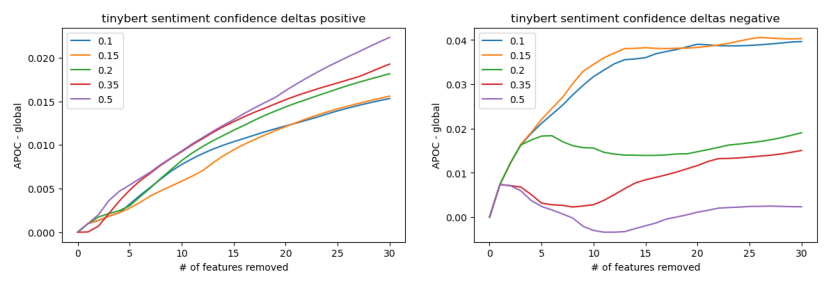

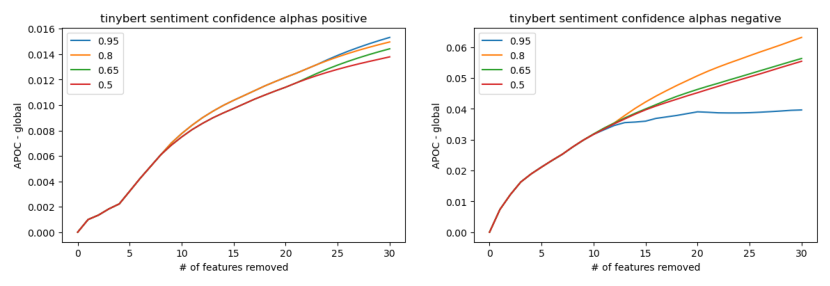

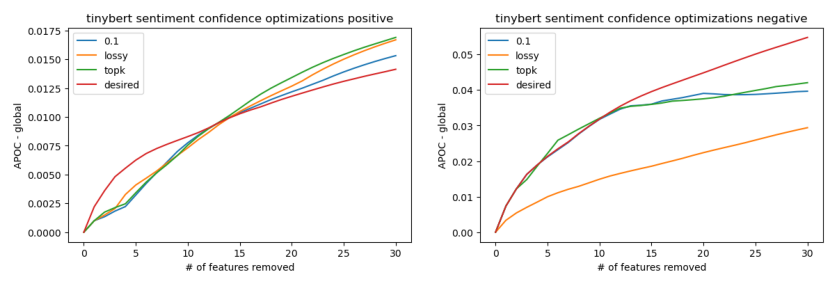

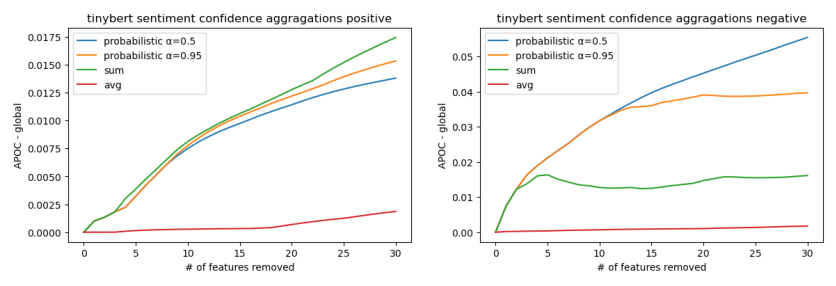

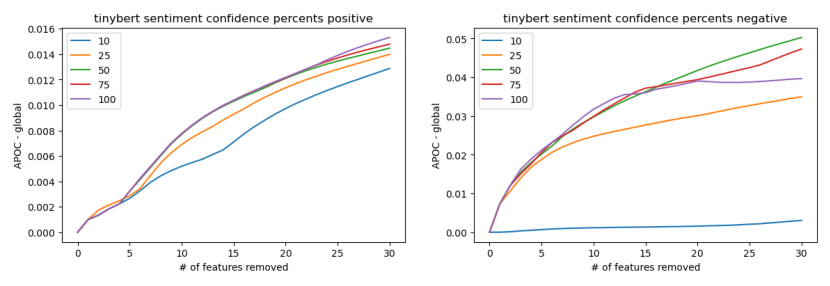

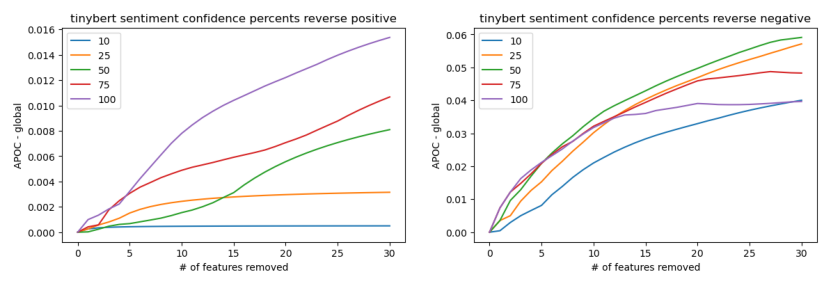

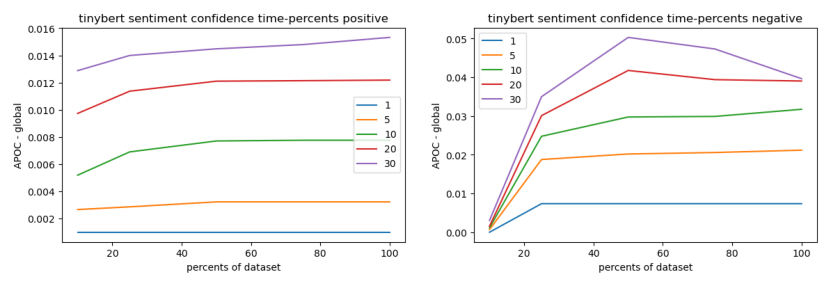

In [22]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

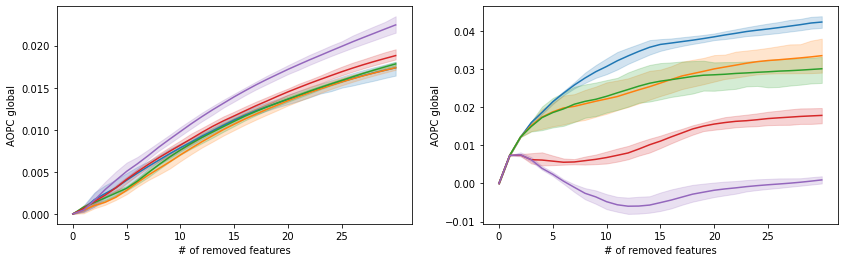

In [4]:
deltas = [0.1, 0.15, 0.2, 0.35, 0.5]
seeds = [42, 84, 126, 168, 210]
AOPC.compare_random_aopcs(folder_name, model, tokenizer, seeds, deltas, anchor_examples, labels, deltas, f'{title} seeds deltas', modified = True, num_removes = 30)

### masking

In [ ]:
# # when masking changing probability to 0.3
# folder_name = f'results/masking/{model_type}/{ds_name}/{sorting}/{delta}'
# pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
# pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
# aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)
# aopc.aopc_global('remove')

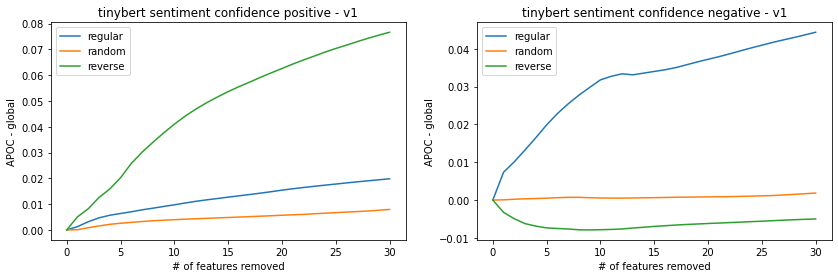

In [29]:
# when changing masking options to 50 instead of 500
folder_name = f'results/masking_50/{model_type}/{ds_name}/{sorting}/{delta}'
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)
aopc.aopc_global('remove')

## Sentiment-lossy

In [3]:
ds_name = 'sentiment'
model_type = 'tinybert'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/lossy-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [9]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

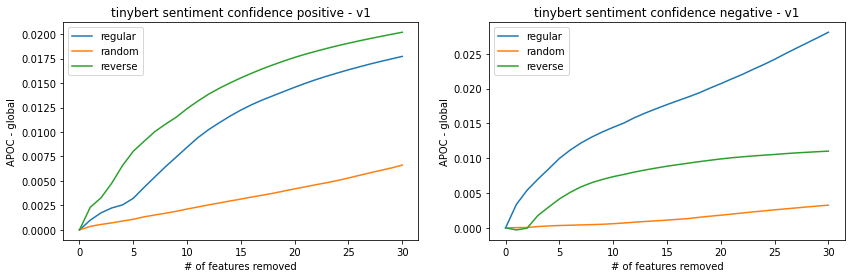

In [10]:
aopc.aopc_global('remove')

### Compare

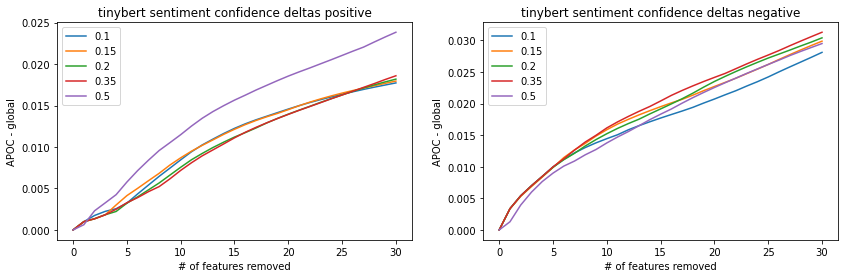

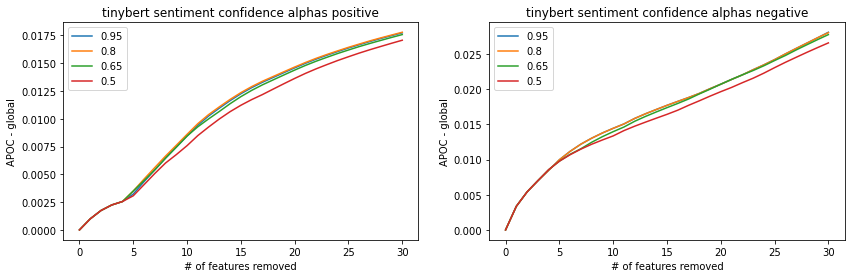

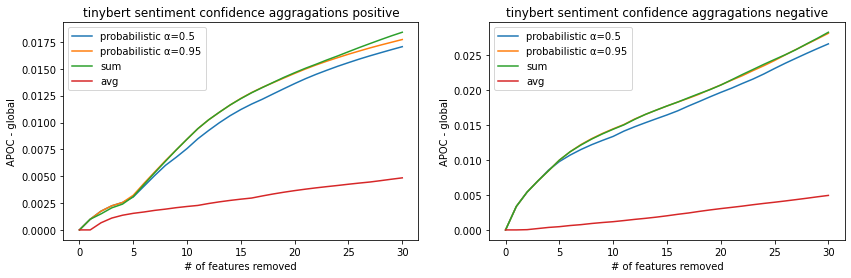

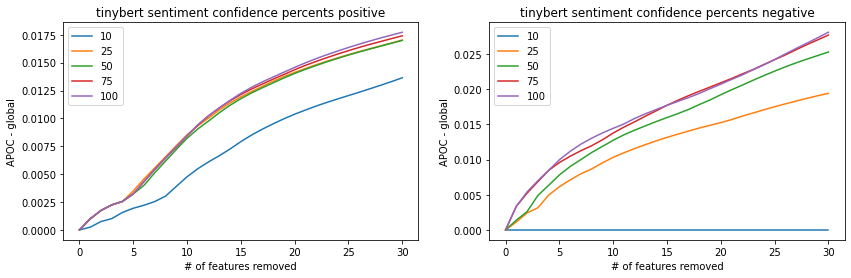

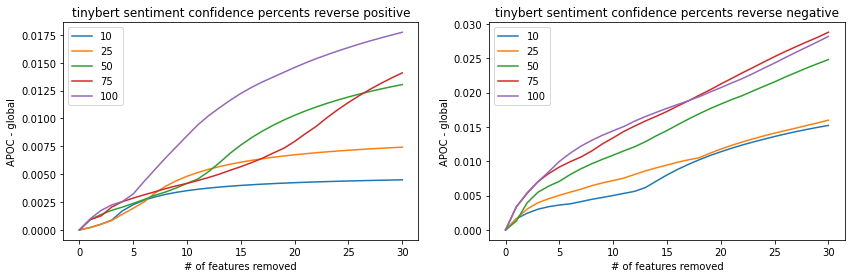

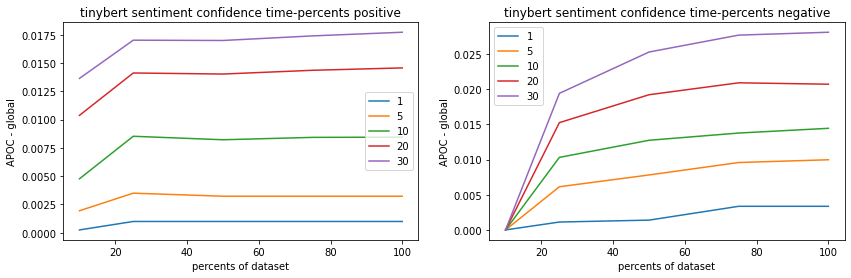

In [4]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

## Sentiment-lossy-topk

In [7]:
ds_name = 'sentiment'
model_type = 'tinybert'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/lossy-topk-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [8]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

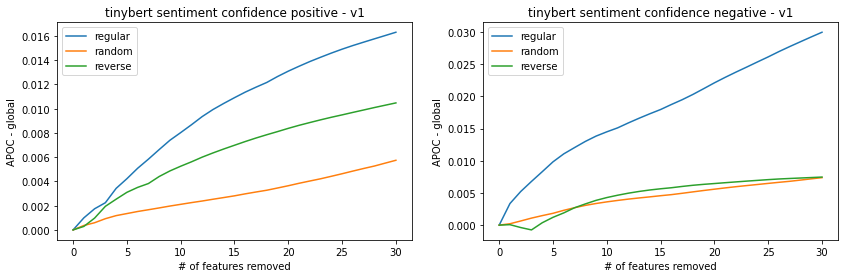

In [9]:
aopc.aopc_global('remove')

### Compare

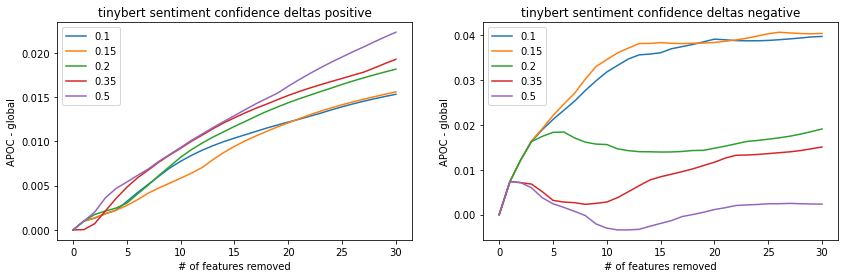

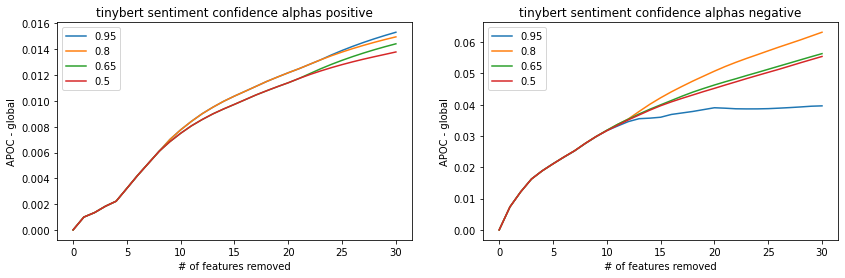

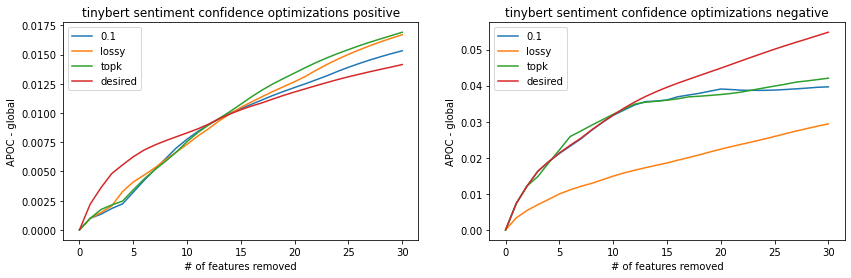

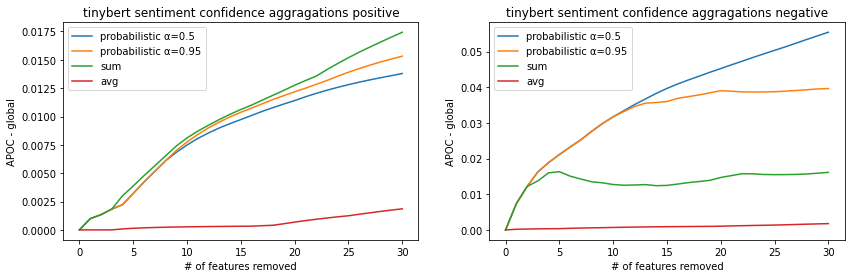

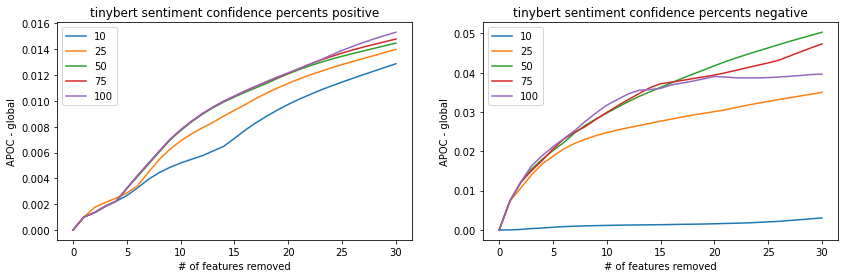

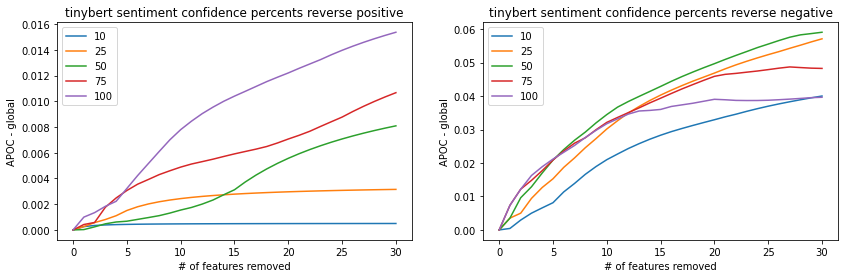

In [ ]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

## Dilemma

In [ ]:
ds_name = 'dilemma'
model_type = 'tinybert'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

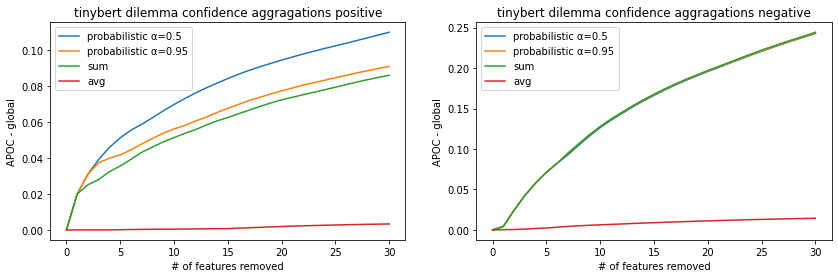

In [15]:
cur_delta = 0.5
aggragations = ['', '', 'sum_', 'avg_']
alphas = [0.5, 0.95, None, None]
legends = ['probabilistic α=0.5', 'probabilistic α=0.95', 'sum', 'avg']
get_scores_fn = lambda x: ScoreUtils.get_scores_dict(folder_name, folder_name, trail_path = f"../{cur_delta}/{x[0]}scores.xlsx", alpha = x[1])
AOPC.compare_aopcs(model, tokenizer, zip(aggragations, alphas), get_scores_fn, anchor_examples, labels, legends, f'{title} aggragations', num_removes=30, modified=True)

### Apoc

In [ ]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

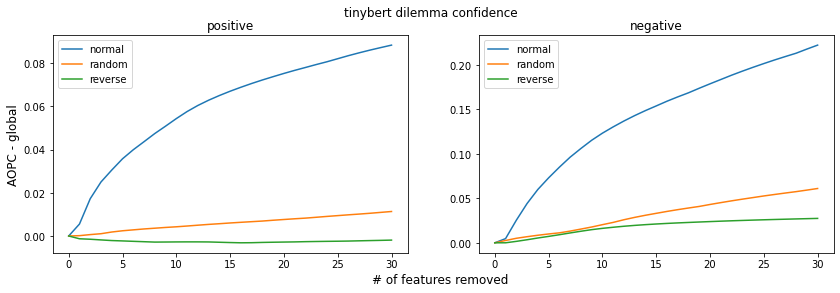

In [ ]:
aopc.aopc_global('remove')

### Compare

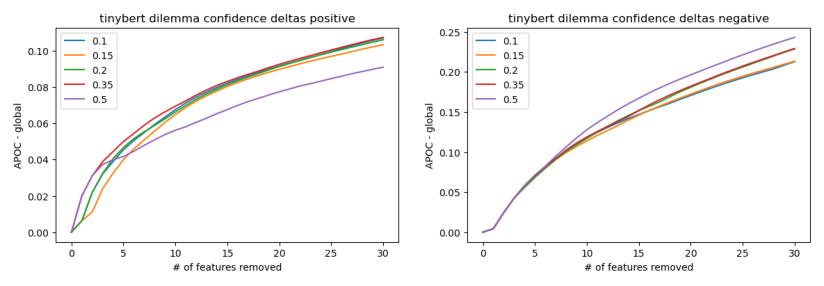

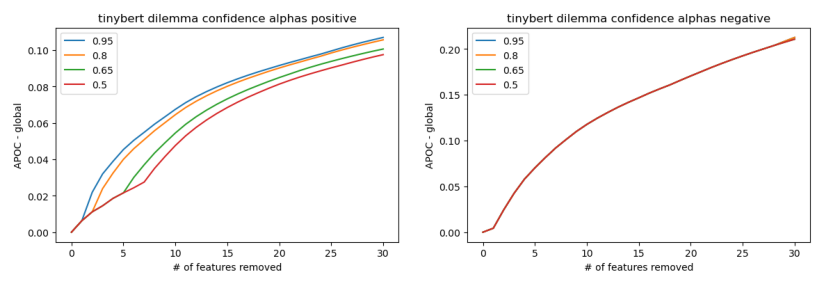

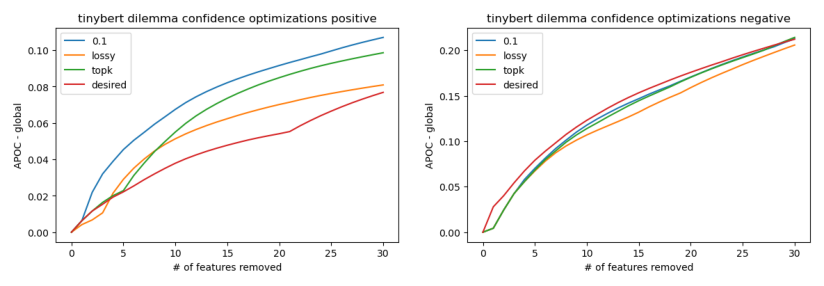

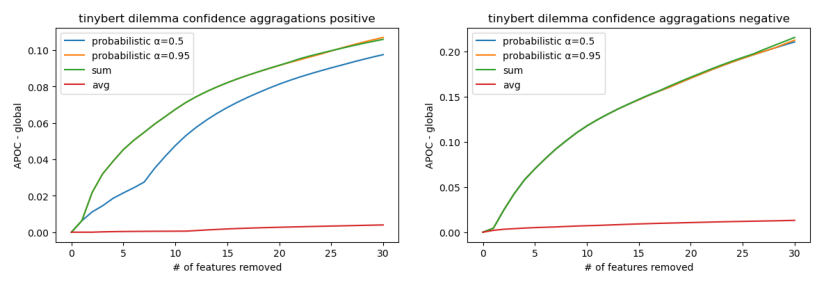

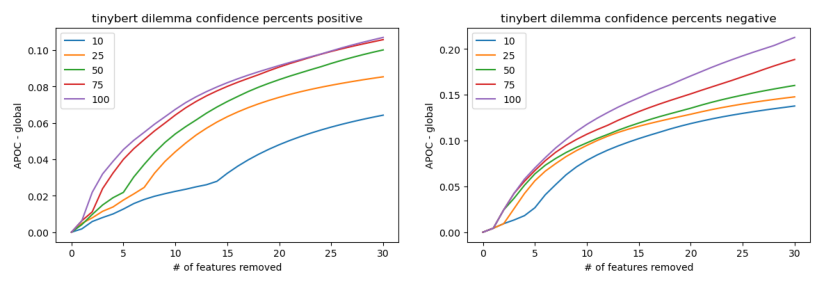

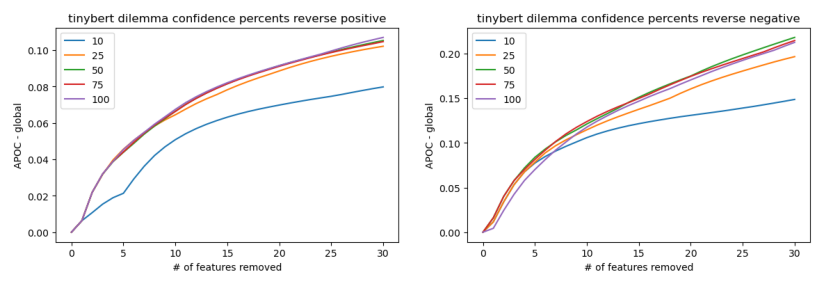

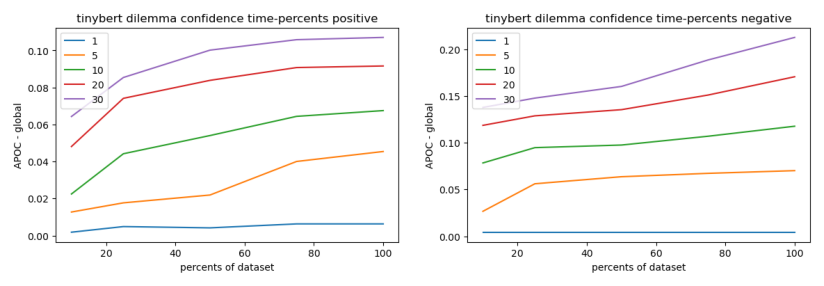

In [33]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

### masking

In [ ]:
# # when masking changing probability to 0.3
# folder_name = f'results/masking/{model_type}/{ds_name}/{sorting}/{delta}'
# pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
# pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
# aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)
# aopc.aopc_global('remove')

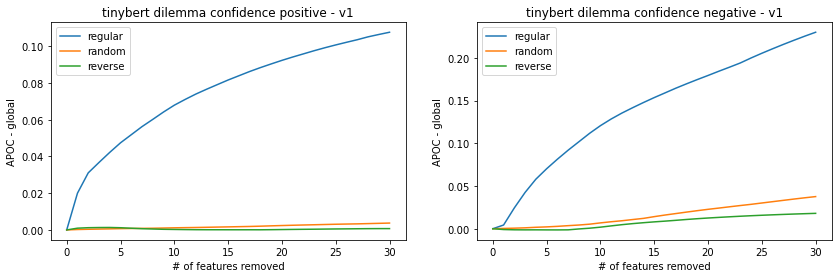

In [8]:
# when changing masking options to 50 instead of 500
folder_name = f'results/masking_50/{model_type}/{ds_name}/{sorting}/{delta}'
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)
aopc.aopc_global('remove')

## Dilemma-lossy

In [5]:
ds_name = 'dilemma'
model_type = 'tinybert'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/lossy-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [6]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

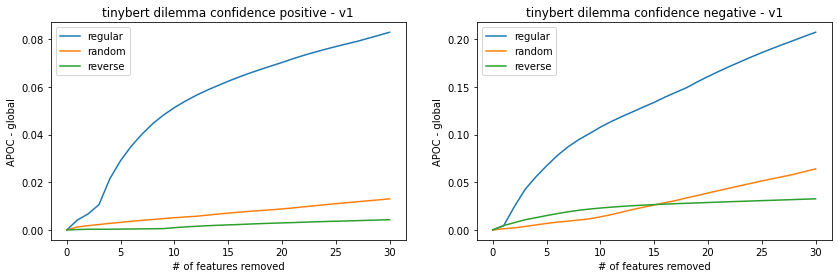

In [7]:
aopc.aopc_global('remove')

### Compare

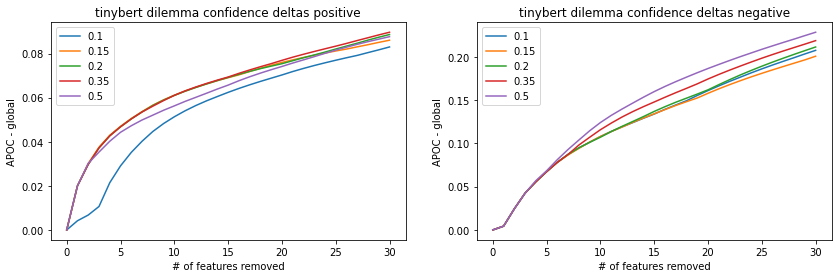

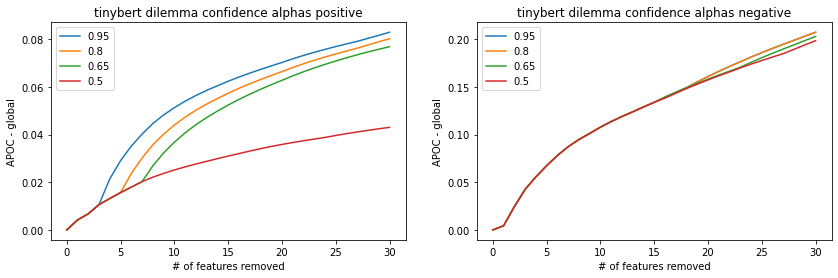

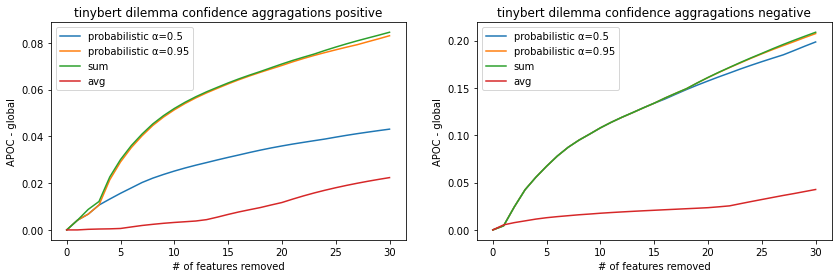

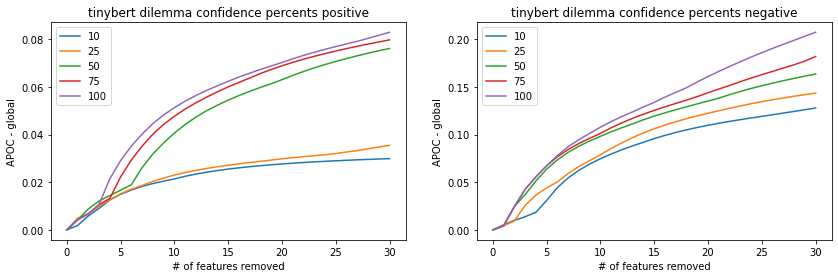

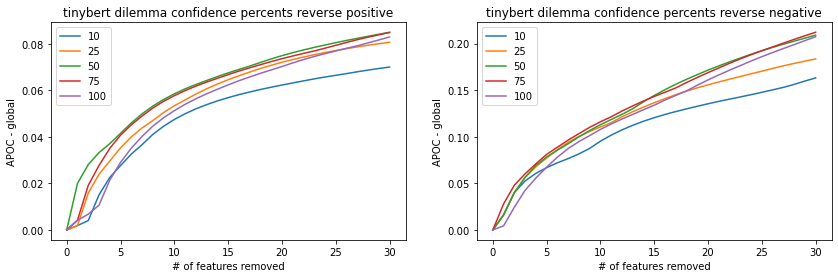

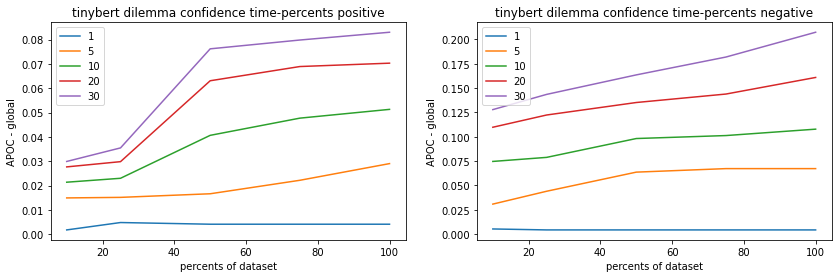

In [8]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

## Dilemma-lossy-topk

In [3]:
ds_name = 'dilemma'
model_type = 'tinybert'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/lossy-topk-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [4]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

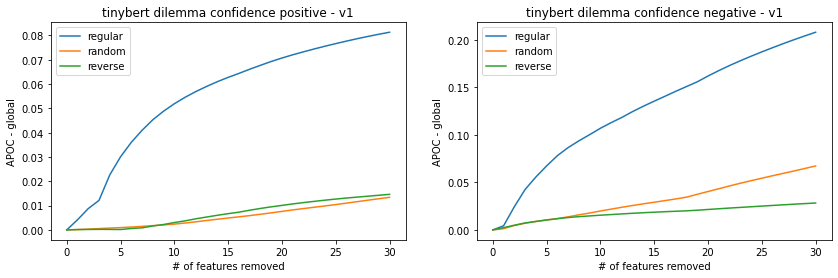

In [5]:
aopc.aopc_global('remove')

### Compare

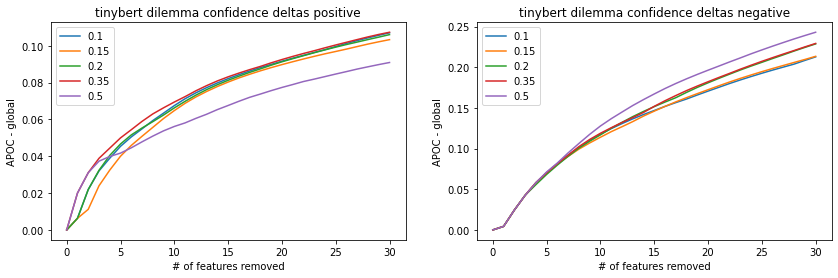

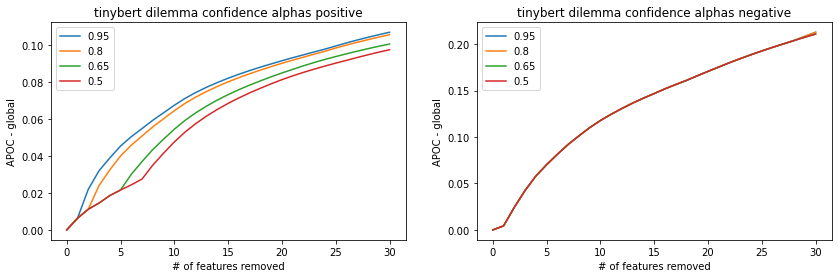

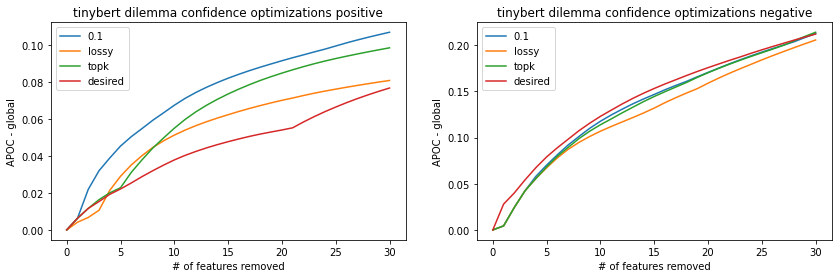

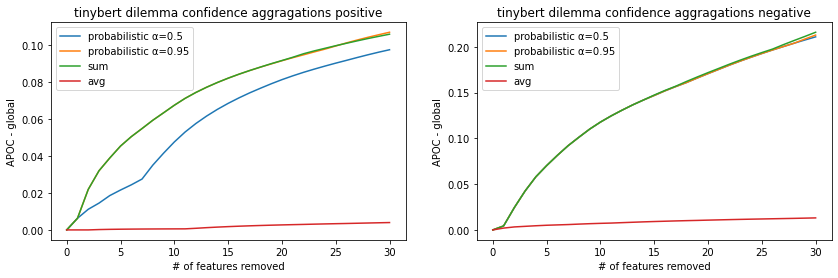

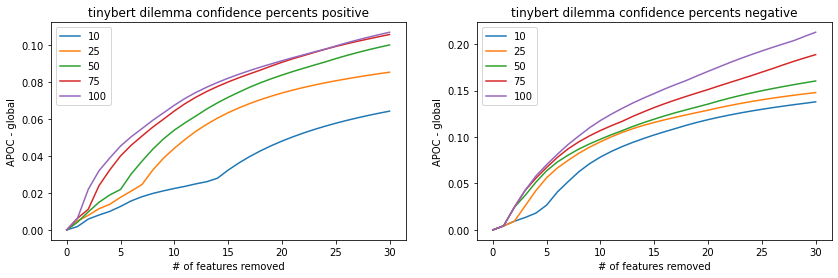

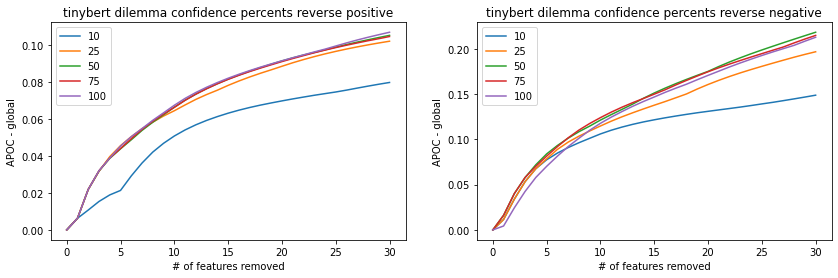

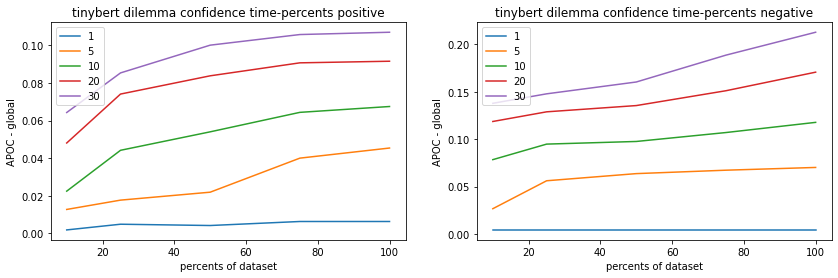

In [6]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

## Toy-Spam

In [3]:
ds_name = 'toy-spam'
model_type = 'tinybert'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [6]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

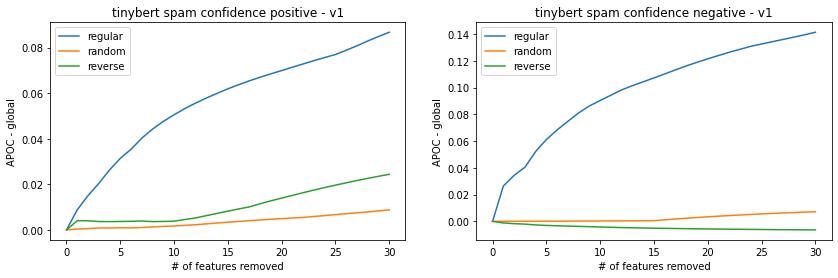

In [7]:
aopc.aopc_global('remove')

### Compare

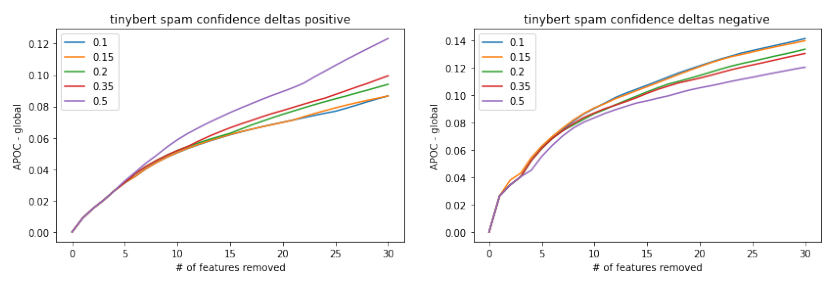

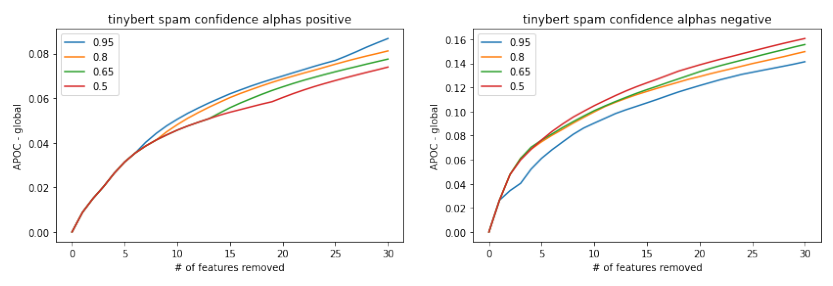

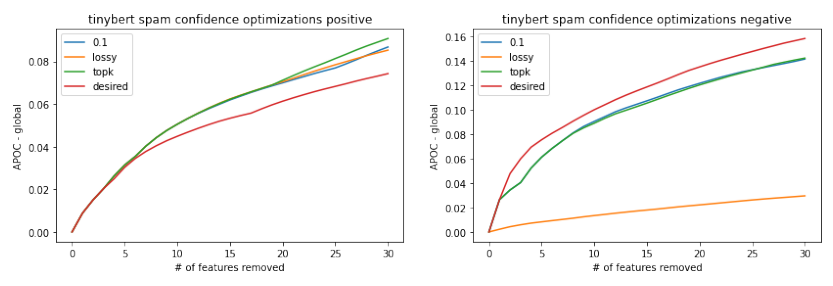

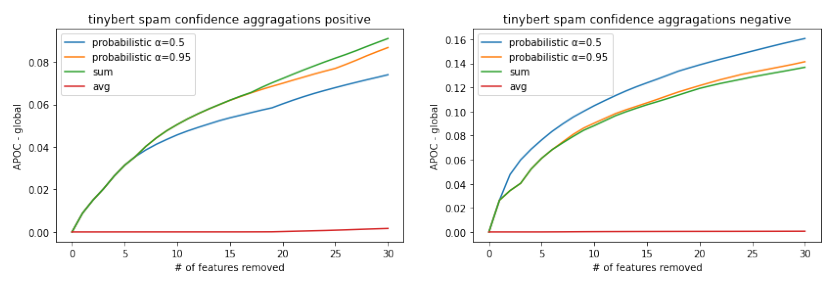

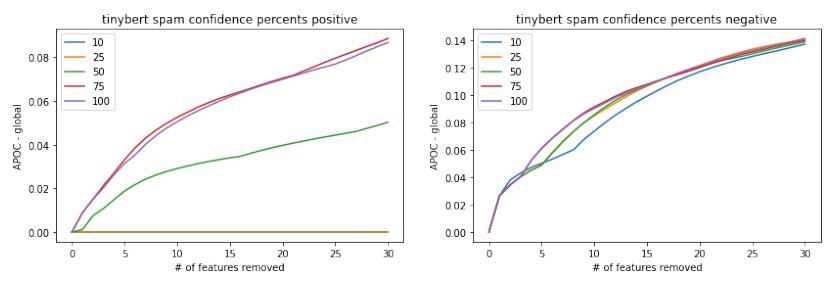

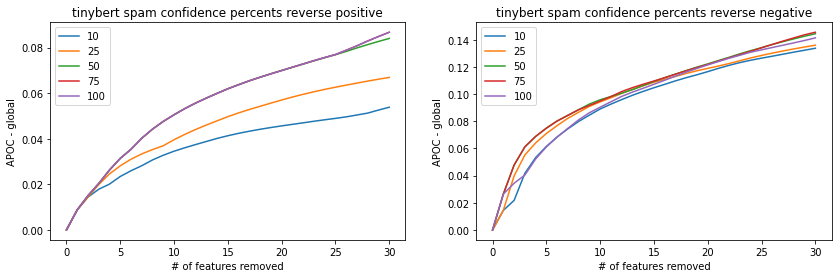

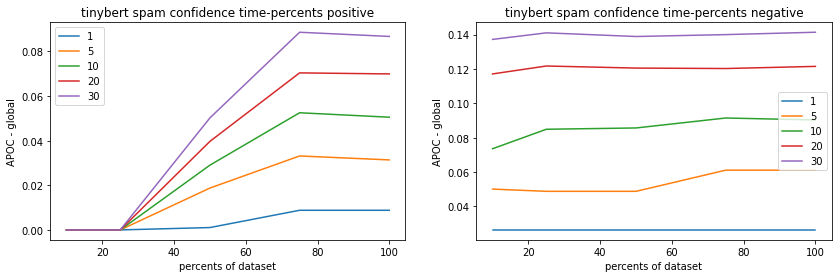

In [4]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

## Sport-Spam

In [5]:
ds_name = 'sport-spam'
model_type = 'tinybert'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [6]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

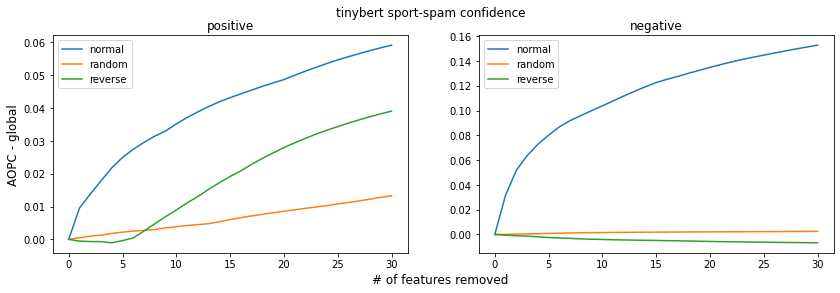

In [7]:
aopc.aopc_global('remove')

### Compare

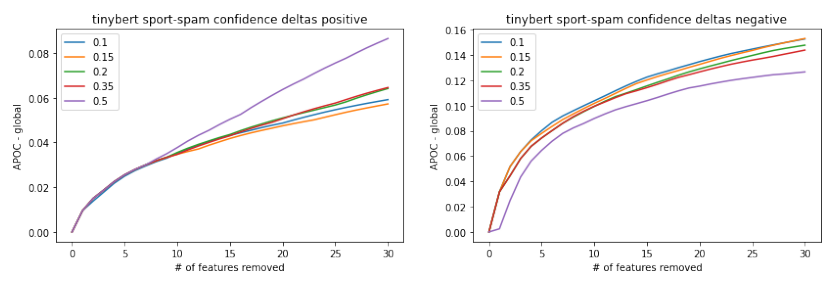

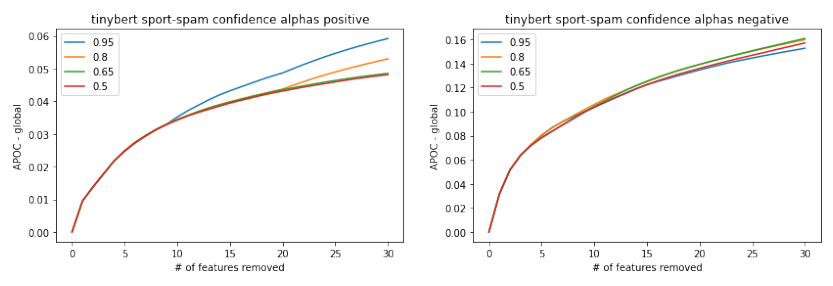

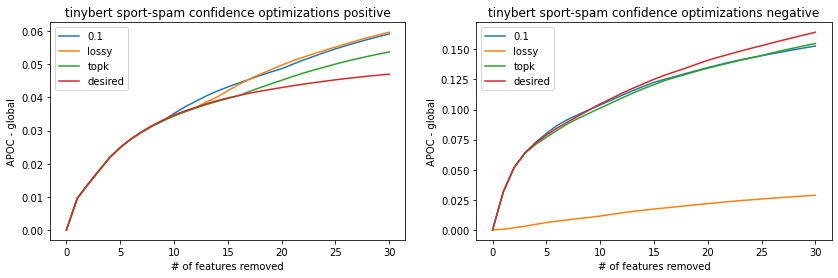

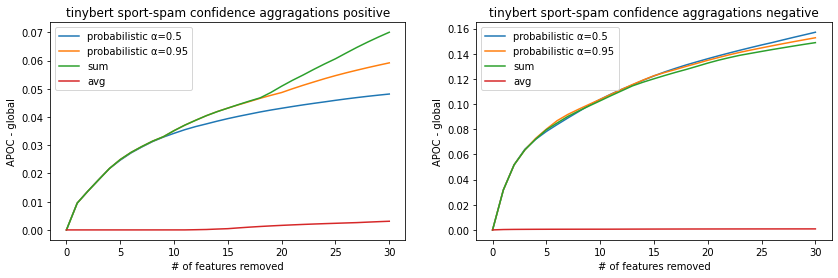

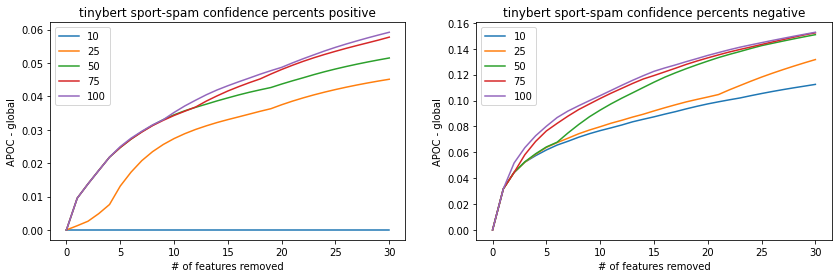

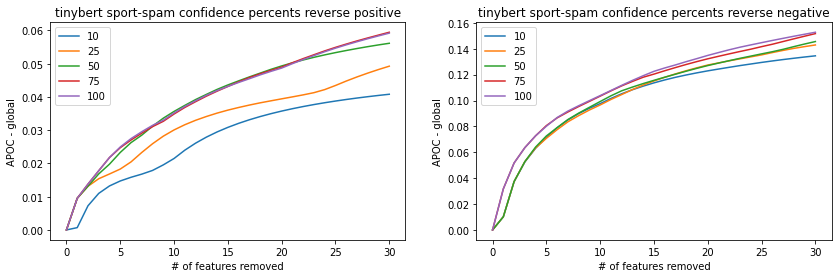

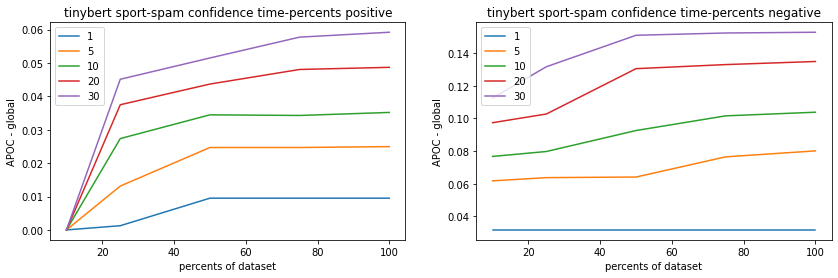

In [5]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

## Home-Spam

In [10]:
ds_name = 'home-spam'
model_type = 'tinybert'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [12]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

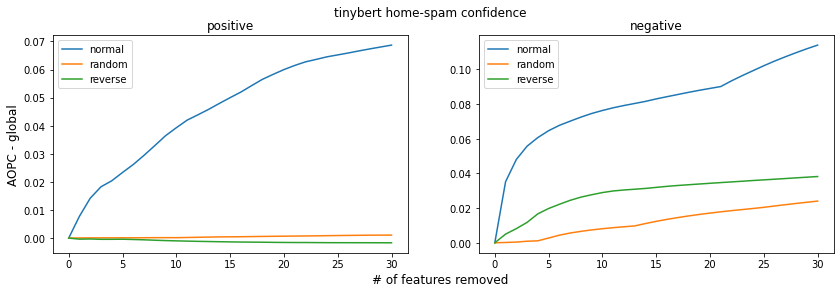

In [15]:
aopc.aopc_global('remove')

### Compare

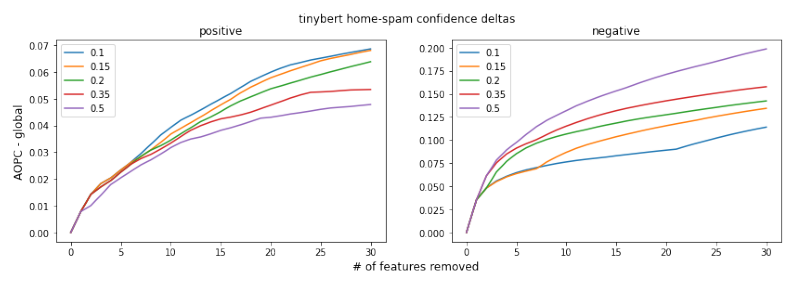

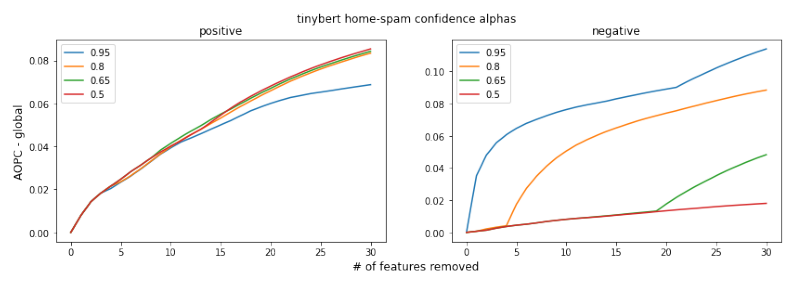

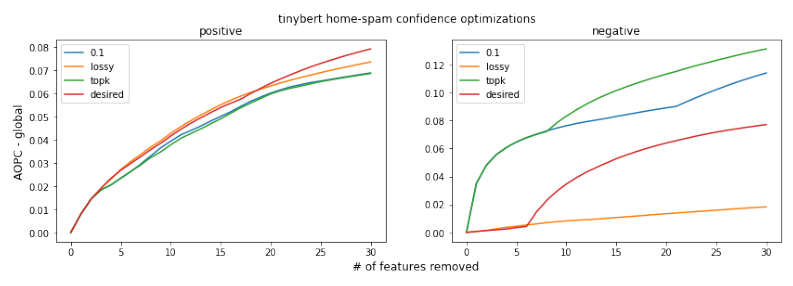

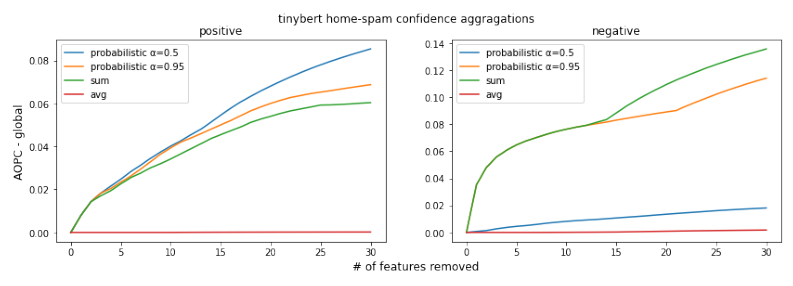

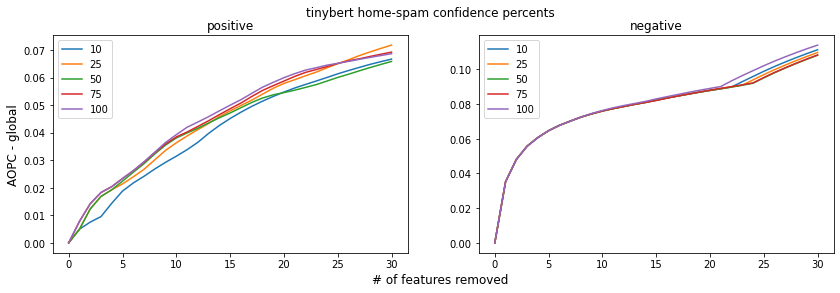

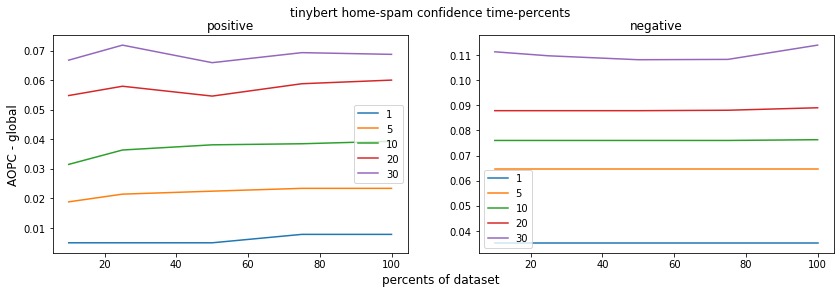

In [18]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

# GRU

## Corona

In [4]:
ds_name = 'corona'
model_type = 'gru'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [5]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

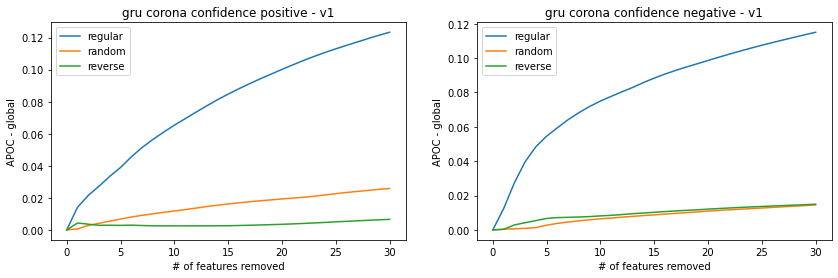

In [6]:
aopc.aopc_global('remove')

### Compare

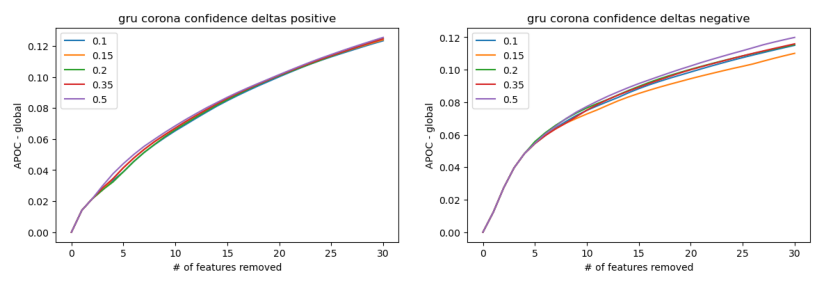

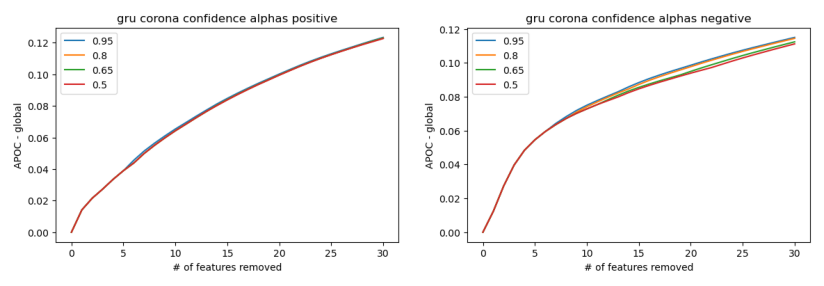

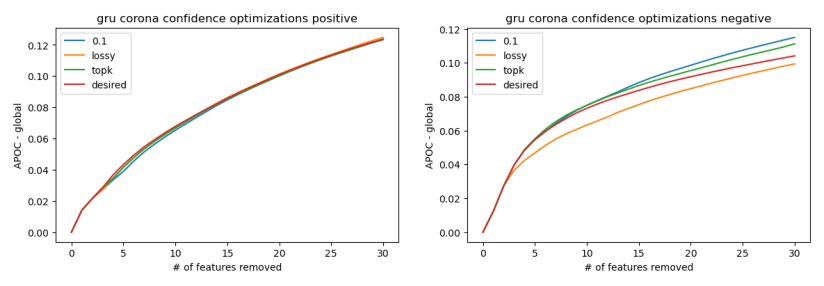

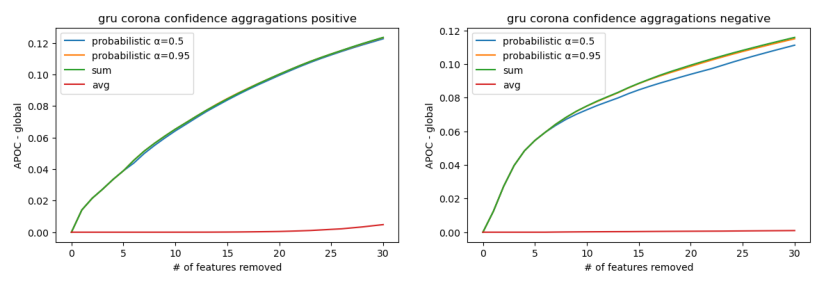

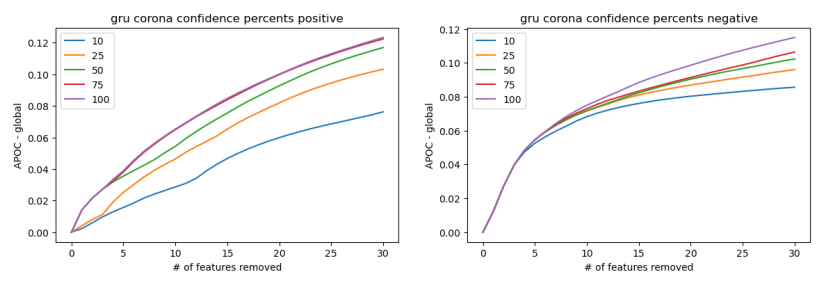

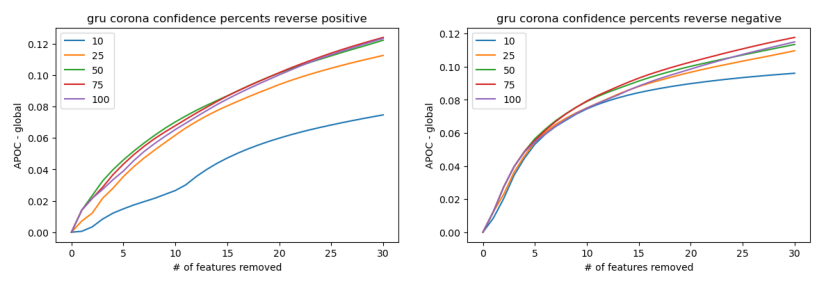

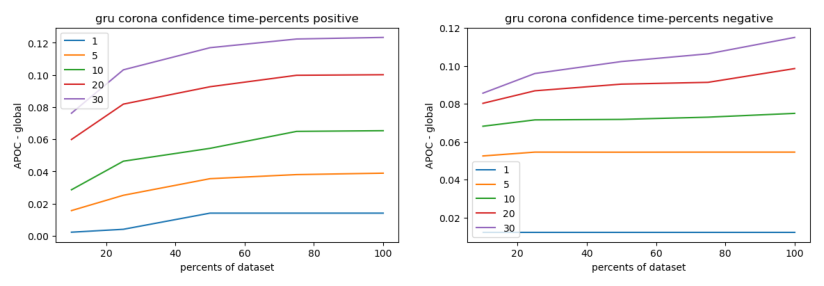

In [7]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(folder_name, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents', modified = True, num_removes = 30)

## Sentiment

In [8]:
ds_name = 'sentiment'
model_type = 'gru'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [9]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

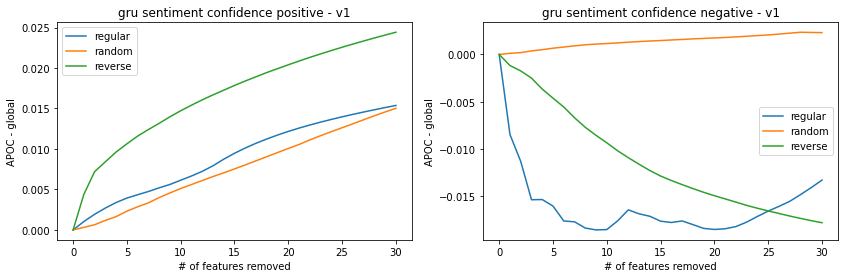

In [10]:
aopc.aopc_global('remove')

### Compare

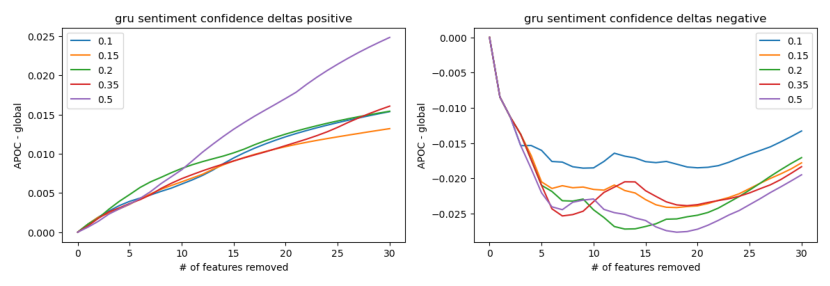

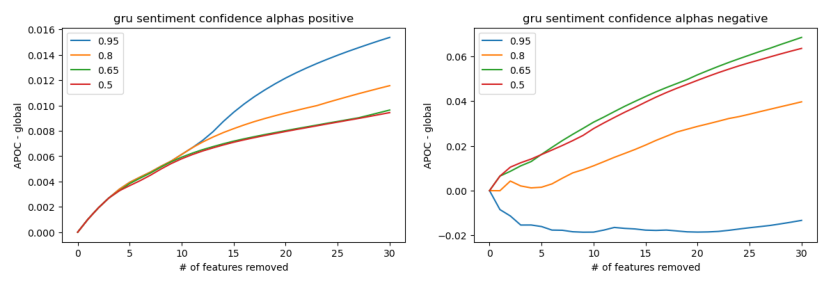

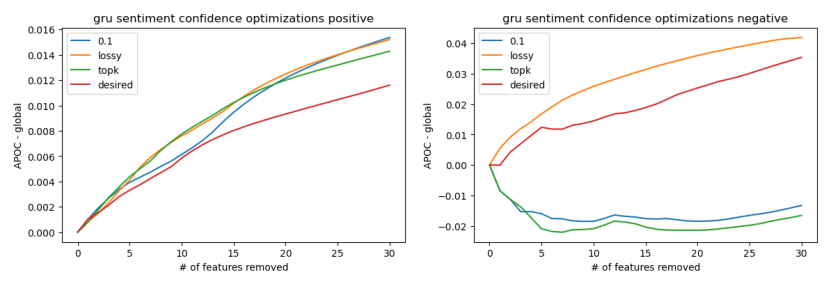

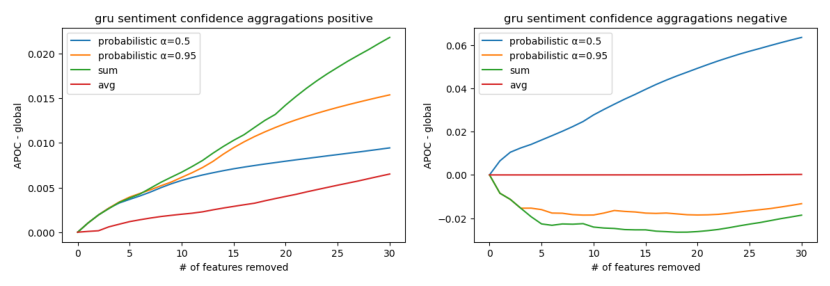

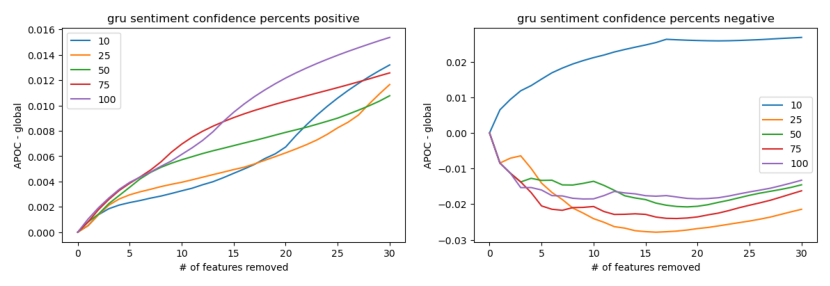

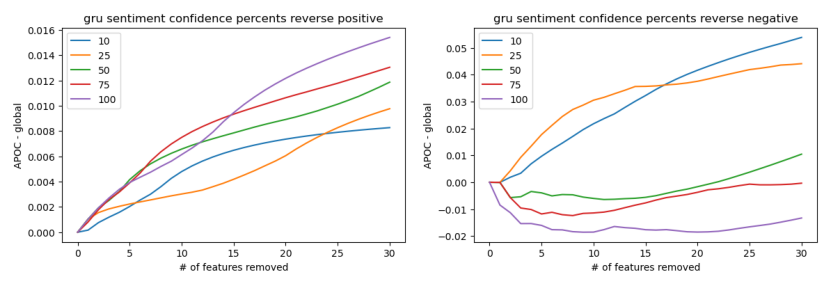

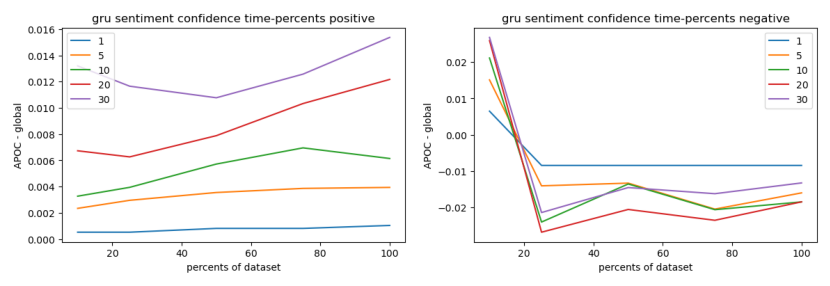

In [11]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(folder_name, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents', modified = True, num_removes = 30)

## Dilemma

In [12]:
ds_name = 'dilemma'
model_type = 'gru'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [13]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

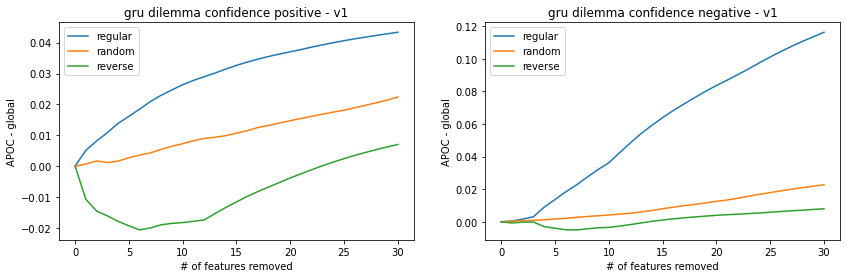

In [14]:
aopc.aopc_global('remove')

### Compare

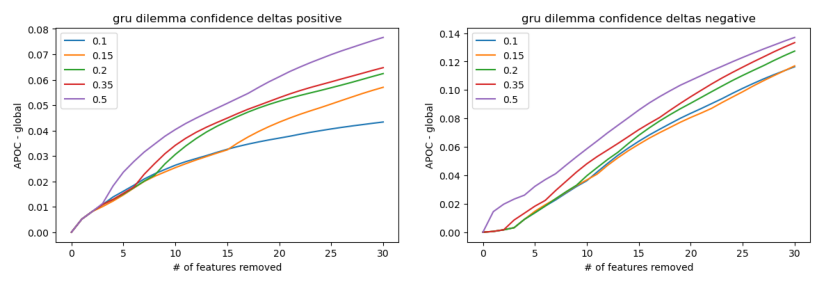

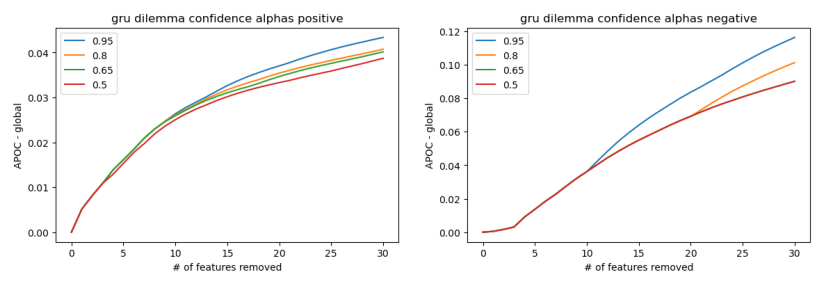

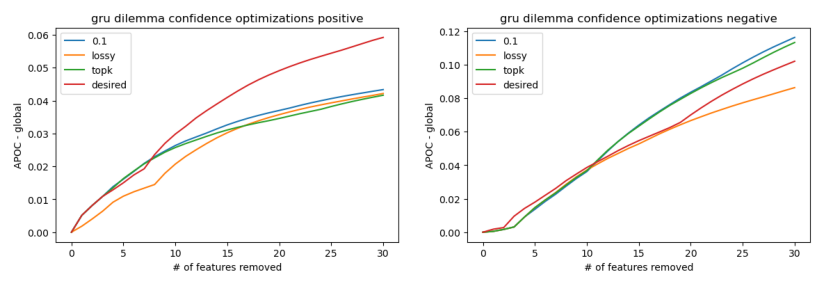

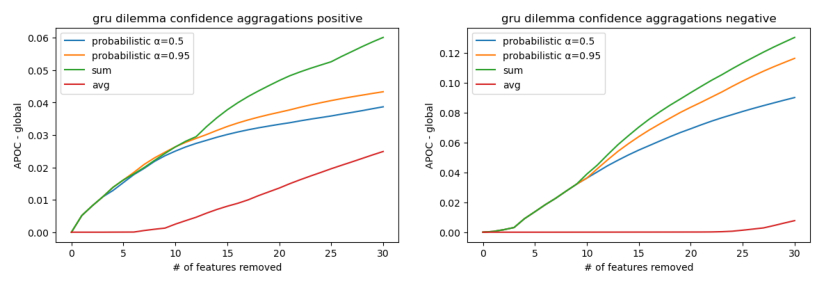

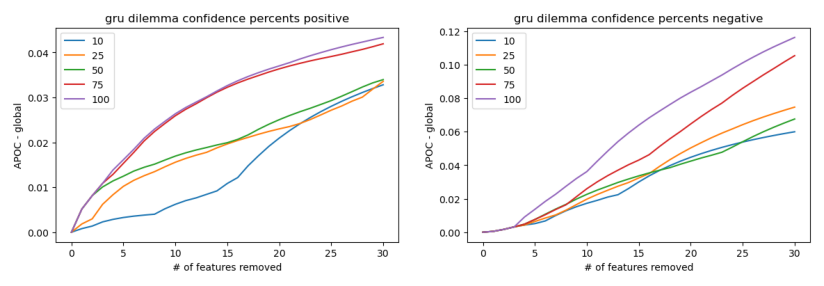

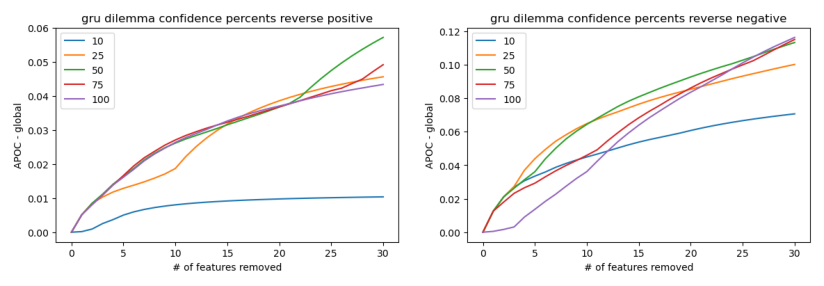

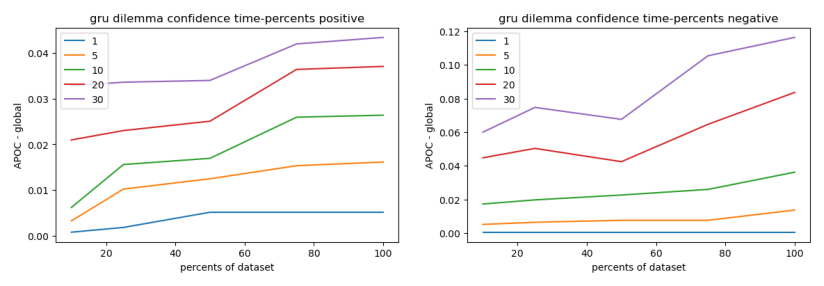

In [15]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(folder_name, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents', modified = True, num_removes = 30)

# Logistic

## Corona

In [16]:
ds_name = 'corona'
model_type = 'logistic'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [17]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

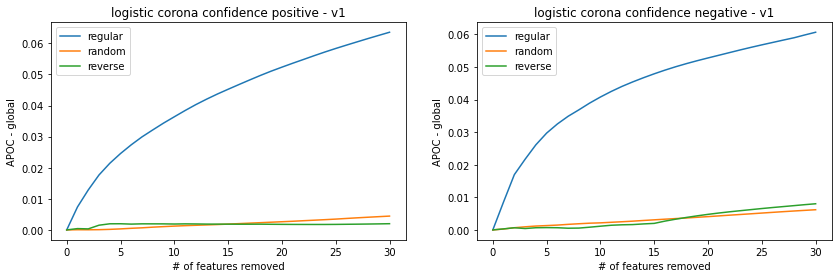

In [18]:
aopc.aopc_global('remove')

### Compare

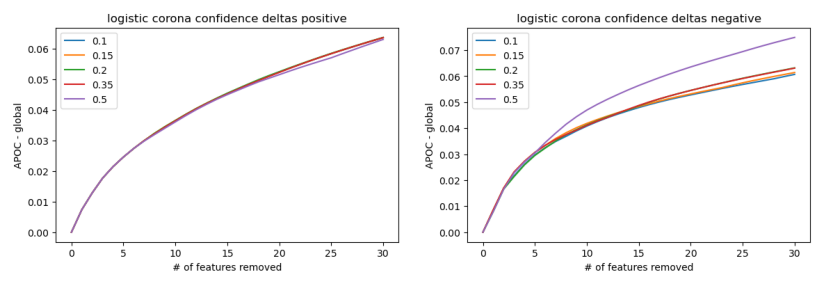

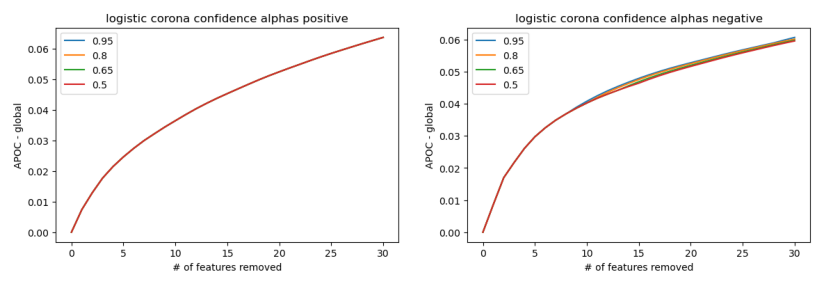

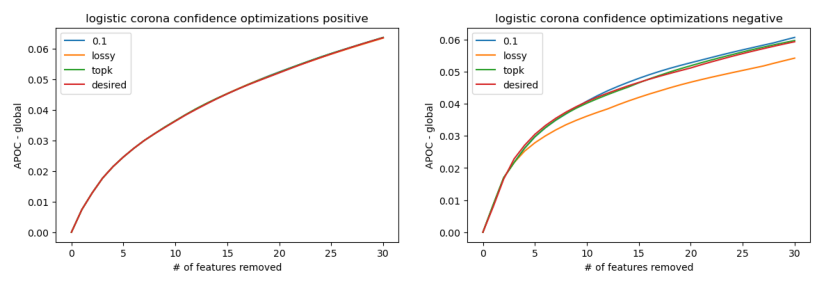

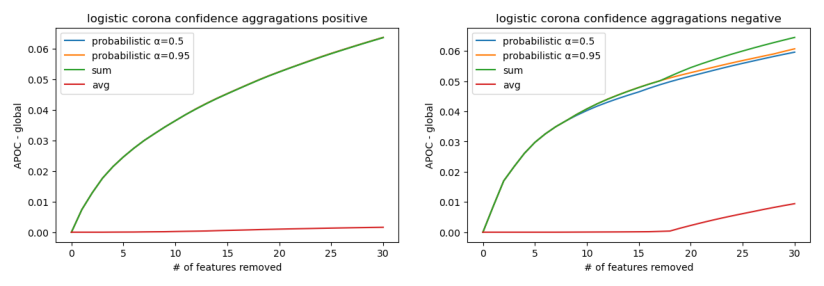

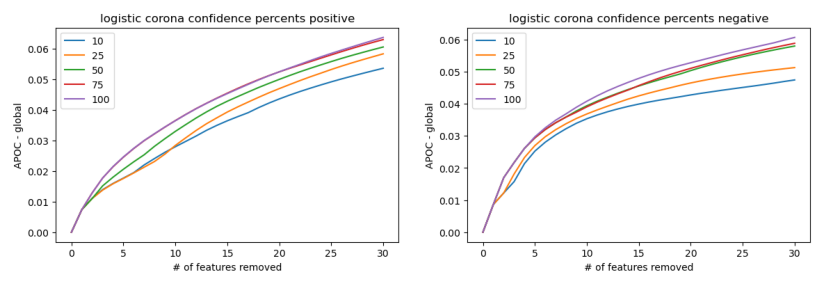

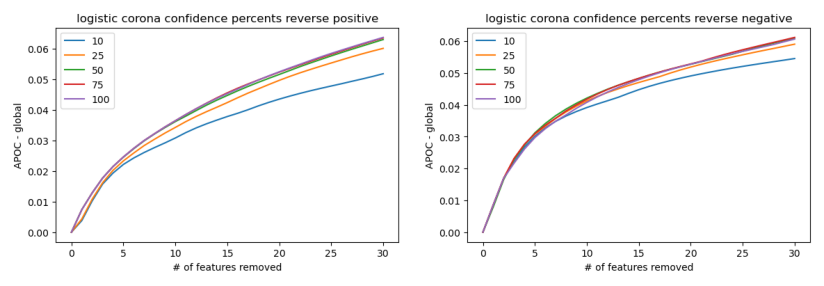

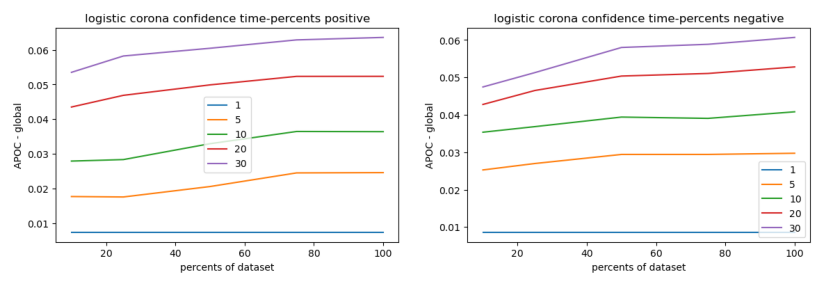

In [19]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(folder_name, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents', modified = True, num_removes = 30)

## Sentiment

In [20]:
ds_name = 'sentiment'
model_type = 'logistic'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [21]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

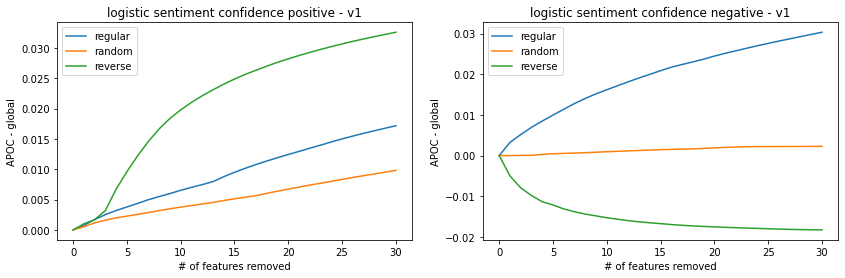

In [22]:
aopc.aopc_global('remove')

### Compare

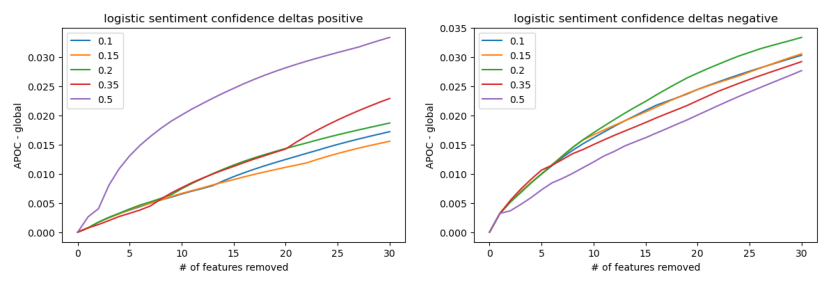

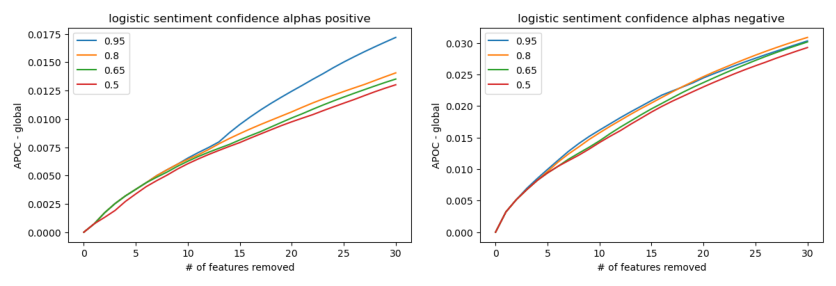

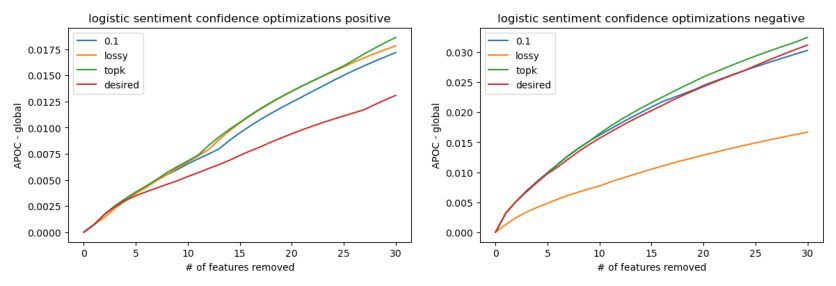

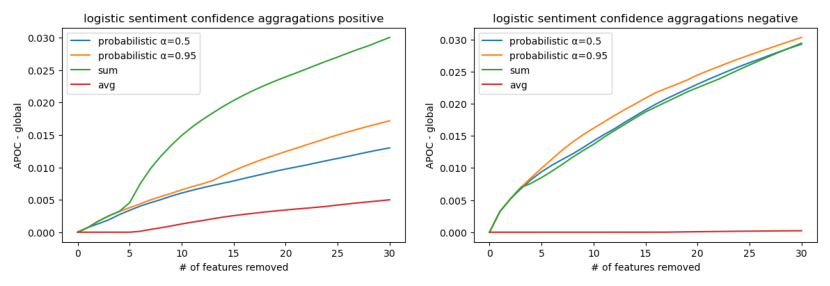

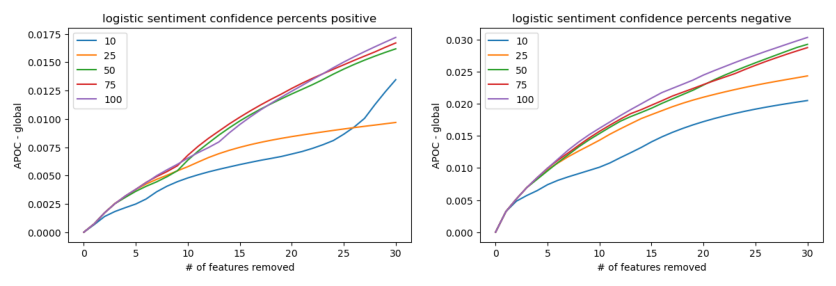

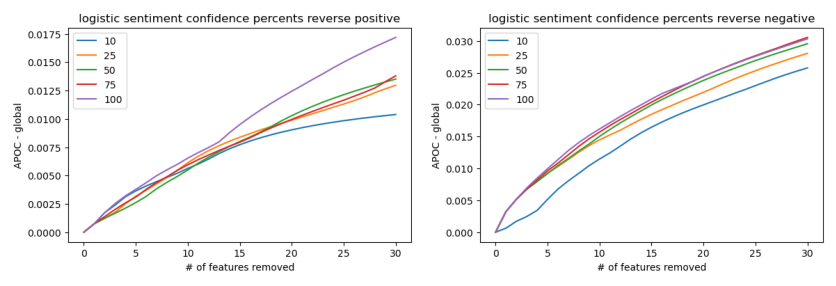

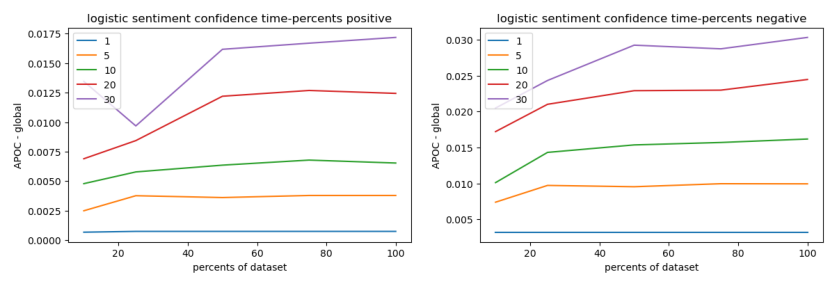

In [23]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(folder_name, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents', modified = True, num_removes = 30)

## Dilemma

In [24]:
ds_name = 'dilemma'
model_type = 'logistic'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [25]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

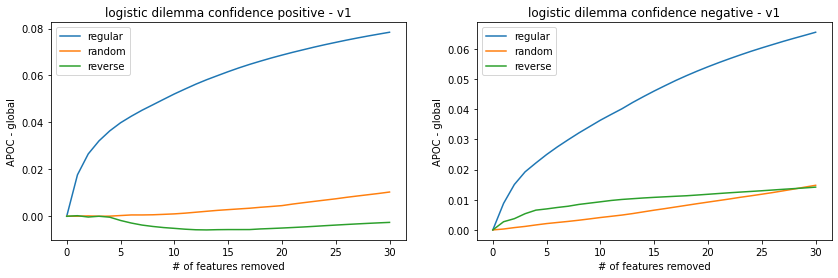

In [26]:
aopc.aopc_global('remove')

### Compare

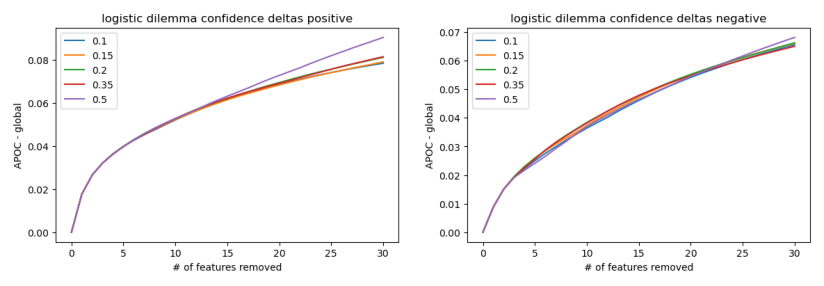

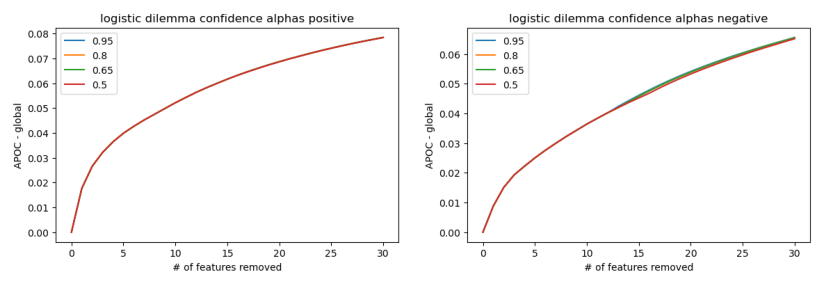

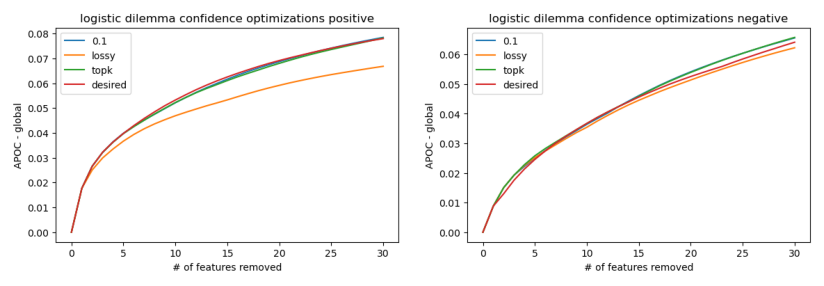

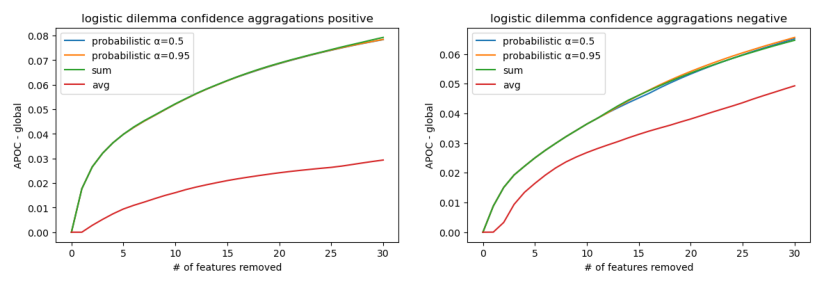

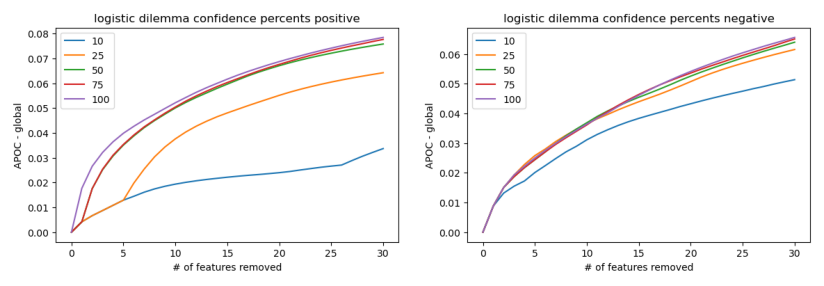

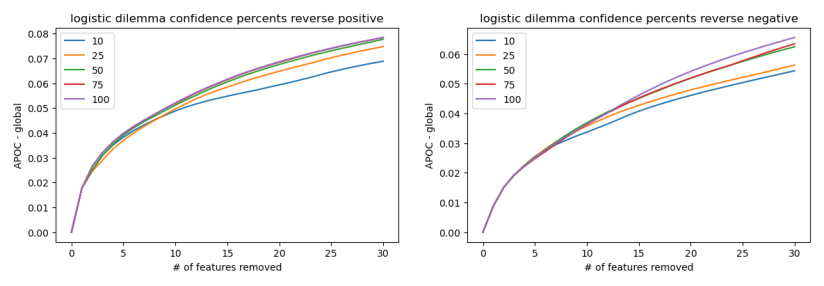

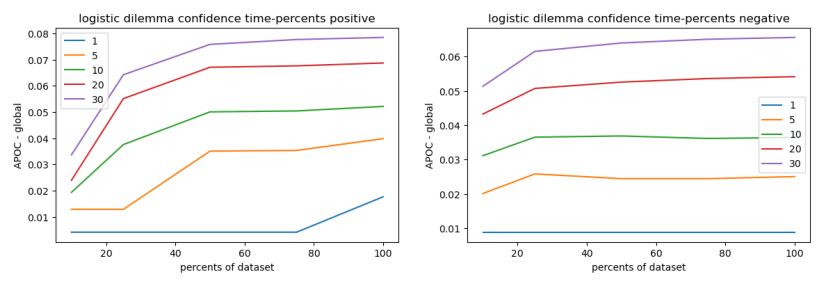

In [27]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(folder_name, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents', modified = True, num_removes = 30)

# SVM

## Corona

In [15]:
ds_name = 'corona'
model_type = 'svm'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [16]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

In [ ]:
aopc.aopc_global('remove')

### Compare

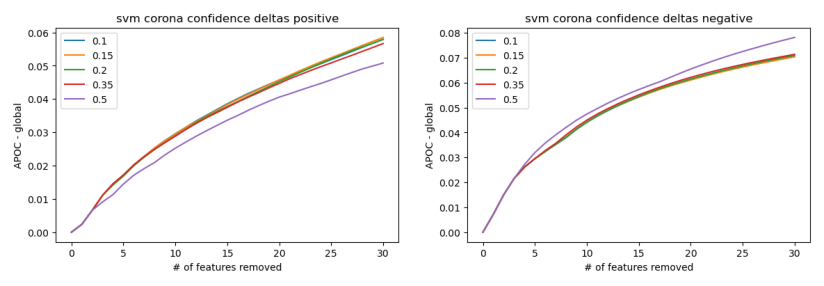

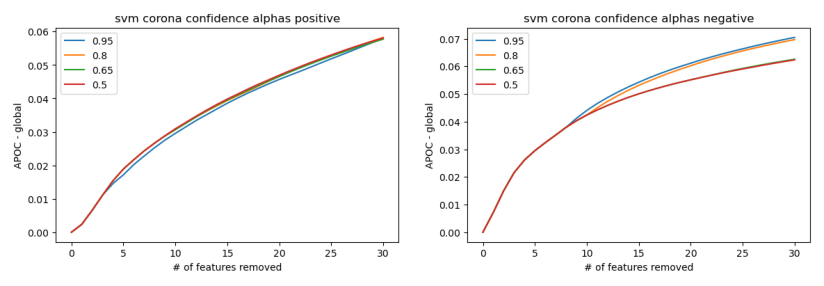

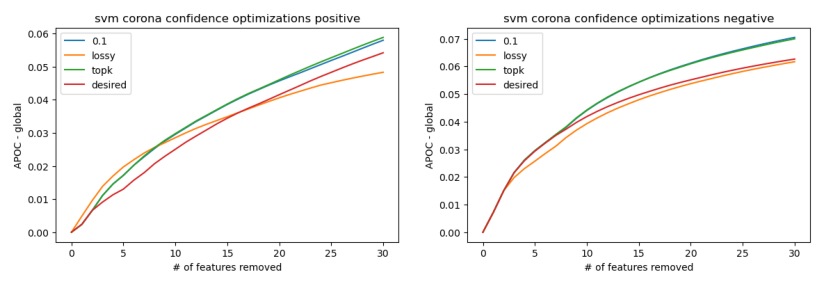

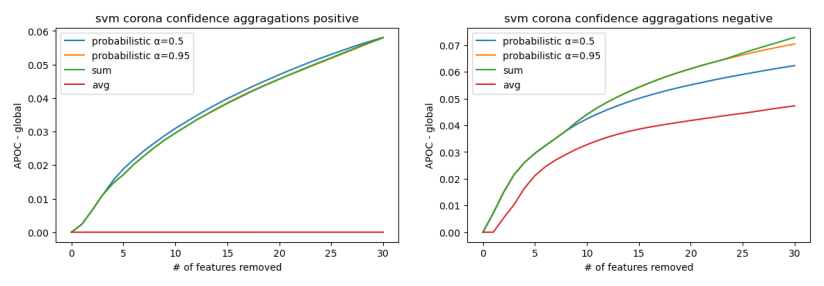

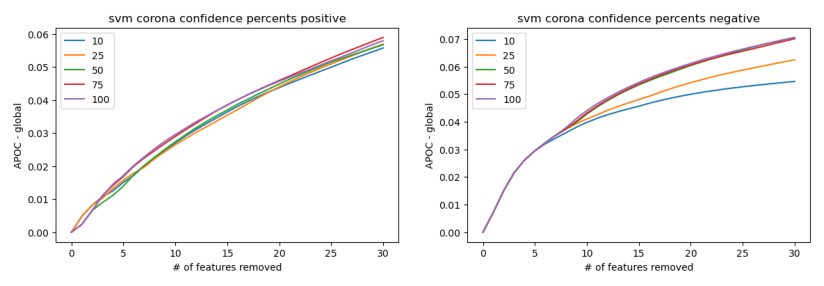

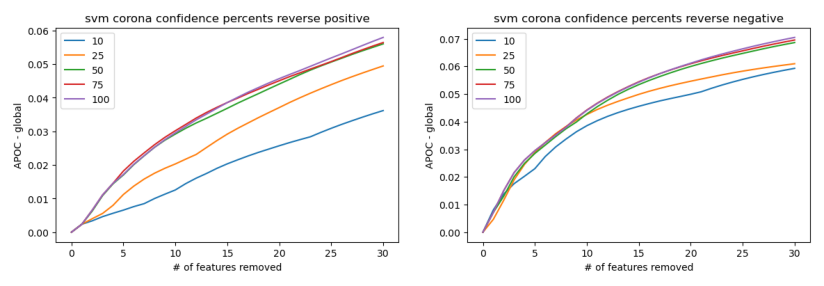

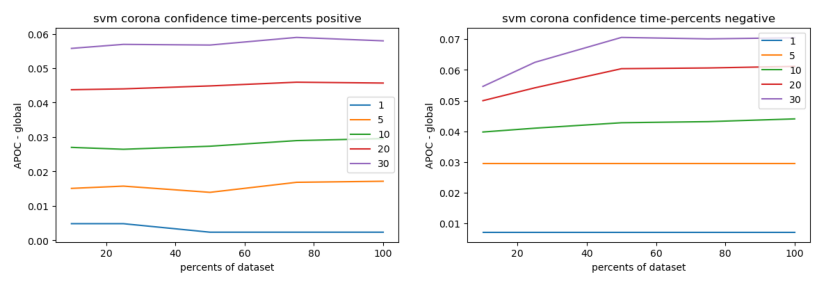

In [10]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(folder_name, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents', modified = True, num_removes = 30)

## Sentiment

In [11]:
ds_name = 'sentiment'
model_type = 'svm'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [ ]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

In [ ]:
aopc.aopc_global('remove')

### Compare

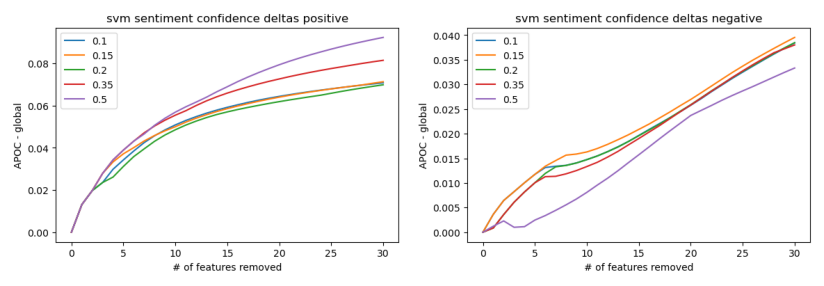

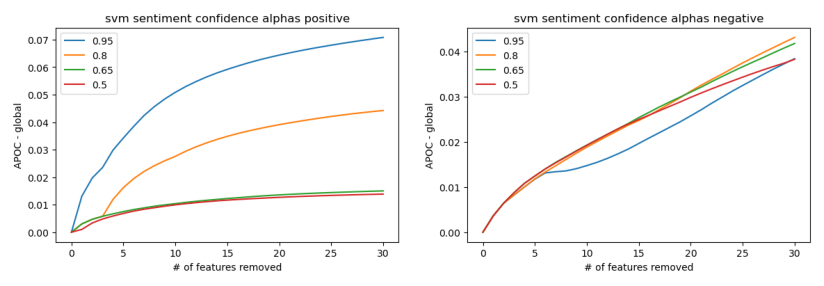

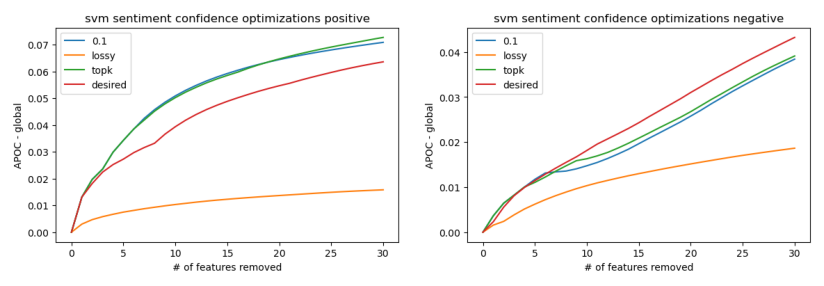

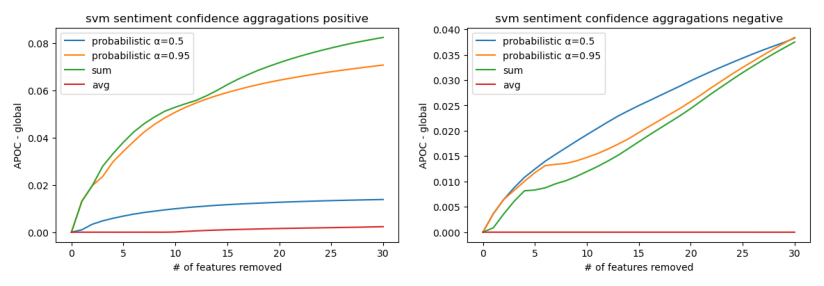

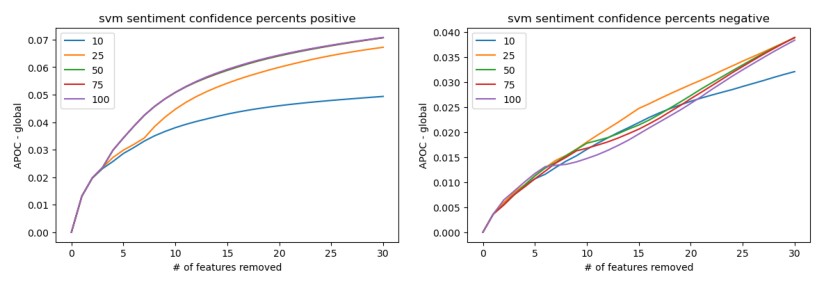

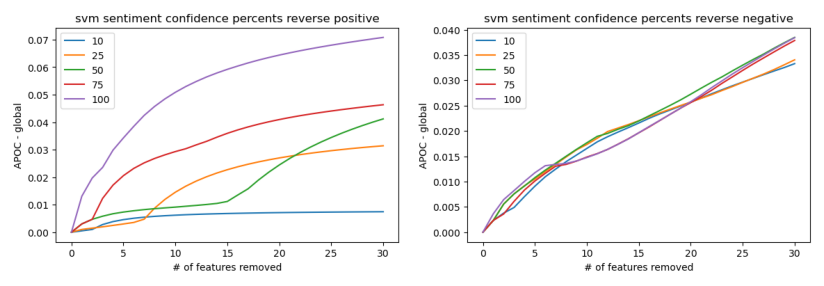

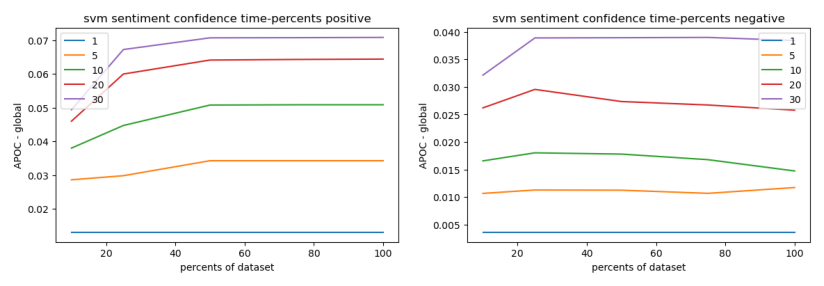

In [12]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(folder_name, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents', modified = True, num_removes = 30)

## Dilemma

In [13]:
ds_name = 'dilemma'
model_type = 'svm'
folder_name = f'results/{model_type}/{ds_name}/{sorting}/{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, folder_name)

### Apoc

In [ ]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(folder_name, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title, modified = True, num_removes = 30)

In [ ]:
aopc.aopc_global('remove')

### Compare

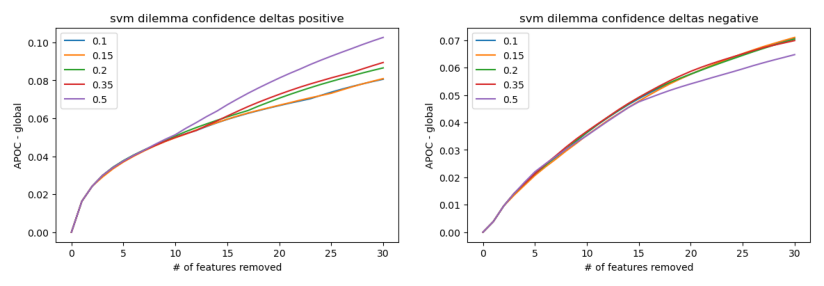

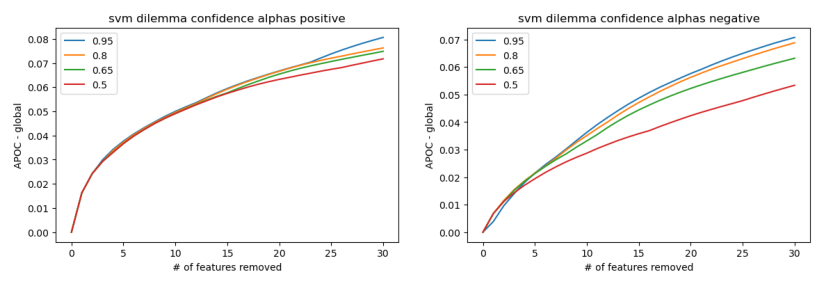

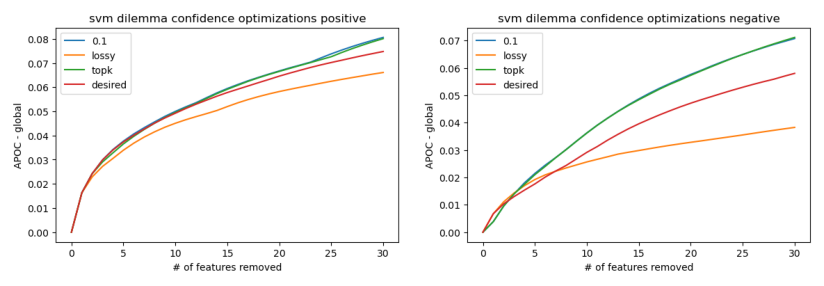

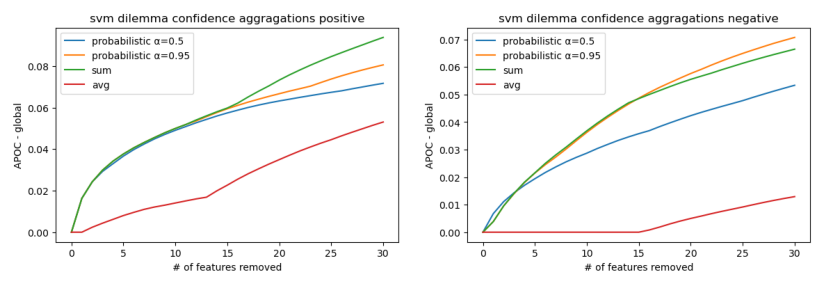

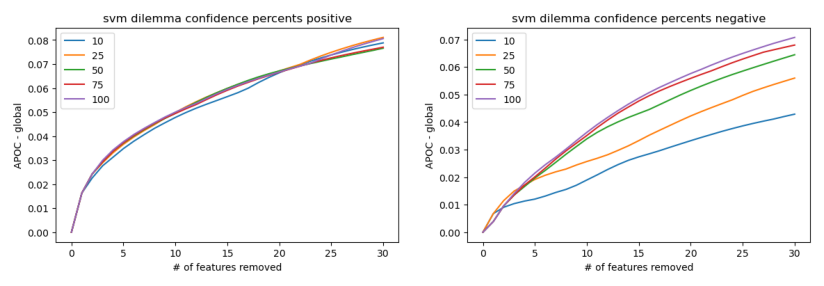

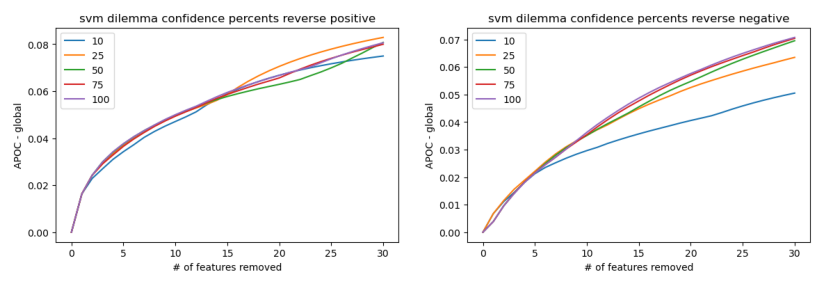

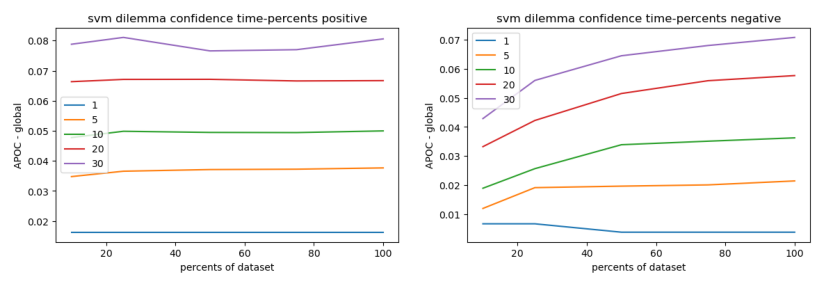

In [14]:
AOPC.compare_all(folder_name, model, tokenizer, anchor_examples, labels, title, modified = True, num_removes = 30)

In [ ]:
# percents = [10, 25, 50, 75, 100]
# seeds = [100, 200, 300, 400, 500]
# AOPC.compare_random_aopcs(folder_name, model, tokenizer, seeds, percents, anchor_examples, labels, percents, f'{title} seeds percents', modified = True, num_removes = 30)